In [1]:
import sys
import os
import pandas as pd
import matplotlib.pyplot as plt
import importlib
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

from statsmodels.regression.mixed_linear_model import MixedLM
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

import sklearn
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV, KFold
from sklearn.linear_model import LogisticRegression, LinearRegression, SGDRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier, RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.svm import LinearSVC, SVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import ConfusionMatrixDisplay, f1_score, make_scorer, confusion_matrix, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from scipy.stats import randint, uniform
from sklearn.model_selection import GroupKFold, cross_val_score


from xgboost import XGBClassifier, XGBRegressor
from catboost import CatBoostClassifier
from catboost import Pool
import catboost as cb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from itertools import product,chain

import plotly.express as px

from scipy.stats import pearsonr


import shap
shap.initjs()

# Get the absolute path of the project root
project_root = os.getcwd()
# Add project root to sys.path
sys.path.append(project_root)
# Define data directory
brighten_dir = os.path.join(project_root, 'BRIGHTEN_data')
charts_dir = os.path.join(project_root, 'charts')
shap_dir = os.path.join(charts_dir, 'shap')
cv_dir = os.path.join(charts_dir, 'cv_scores')
val_dir = os.path.join(charts_dir, 'val_scores')

# Import and reload my custom scripts
from scripts import preprocessing as pre
from scripts import visualization as vis
from scripts import feature_selection as fs
from scripts import clustering as cl
from scripts import variables as var
from scripts import pca_model as pca
importlib.reload(pre)
importlib.reload(vis)
importlib.reload(fs)
importlib.reload(cl)
importlib.reload(var)
importlib.reload(pca)


# Import from cloned github repos
import hyperopt
print(hyperopt.__file__)
from hyperopt import tpe, hp, fmin, STATUS_OK, Trials
from hyperopt import tpe, hp, fmin, STATUS_OK, Trials
import hyperopt.pyll.stochastic
################ DEFINE column variables from data ###################
from scripts.variables import id_columns, daily_cols_v1, daily_v2_common 
from scripts.variables import phq2_cols, phq9_cols, weekly_cols, passive_cols

## Load in dfs scaled
df_names = ['v1_day', 'v2_day', 'v1_week', 'v2_week']
df_pca = ['v1_day_pca', 'v1_week_pca']
df_all = df_names + df_pca

if not 'idx' in id_columns:
    id_columns.append('idx')
if not 'participant_id' in id_columns:
    id_columns.append('participant_id')

print(id_columns)


########################################## MODELS #######################################
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, BaggingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.svm import LinearSVC, LinearSVR
from xgboost import XGBClassifier, XGBRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
import xgboost as xgb
# commenting out linear svm because we didn't drop skewed/two tailed variables
regs = [
    ('Decision Tree', DecisionTreeRegressor()),
    ('Linear SVM', LinearSVR(random_state=42, max_iter=10000, dual='auto')),
    ('Hist Gradient Tree', HistGradientBoostingRegressor()),
    ('Random Forest', RandomForestRegressor(random_state=42)),
    ('XGBoost', XGBRegressor(objective='reg:squarederror', random_state=42)),
    ('AdaBoost', AdaBoostRegressor(random_state=42)),
    ('Gradient Boost', GradientBoostingRegressor(random_state=42)),
    ('Bagging', BaggingRegressor(random_state=42)),
    ('CatBoost', CatBoostRegressor(random_state=42, verbose=0))
]


regs_someNA = [
    ('Hist Gradient Boost', HistGradientBoostingRegressor()),
    ('XGBoost', XGBRegressor(objective='reg:squarederror', random_state=42)),
    ('CatBoost', CatBoostRegressor(random_state=42, verbose=0))
]


/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/git_repos/hyperopt_repo/hyperopt/__init__.py
['num_id', 'dt', 'week', 'day', 'week_id', 'idx', 'v', 'season', 'day_of_week', 'cohort', 'participant_id']


In [ ]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'phq2_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v2_day_clean.csv'))
data["num_id"] = data["num_id"].astype("category")

model = smf.mixedlm(f"{y_var} ~ hours_active_hr + hours_stationary_nhw_hr + hours_of_sleep_hr + location_variance_hr + temp_mean", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())


Relationship to y_col phq2_sum, Nested Linear Regression on "num_id"
              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    phq2_sum  
No. Observations:     1212       Method:                REML      
No. Groups:           16         Scale:                 0.3773    
Min. group size:      7          Log-Likelihood:        -1162.1799
Max. group size:      234        Converged:             Yes       
Mean group size:      75.8                                        
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept               -0.232    0.078 -2.973 0.003 -0.385 -0.079
hours_active_hr          0.002    0.027  0.062 0.951 -0.051  0.055
hours_stationary_nhw_hr -0.060    0.030 -1.999 0.046 -0.118 -0.001
hours_of_sleep_hr        0.029    0.034  0.834 0.404 -0.038  0.095
location

In [14]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'target__phq2_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v1_day_trainval_transformed.csv'))
data[y_var] = data[y_var].astype(float)
data["num_id"] = data["num_id"].astype("category")
data.columns = data.columns.str.replace('non-skew__', 'nonskew__', regex=False)
data = data.dropna(subset=["bc__mobility", "bc__mobility_radius", 
                           "nonskew__call_duration", "target__phq2_sum", y_var])

model = smf.mixedlm(f"{y_var} ~ bc__mobility + bc__mobility_radius + nonskew__call_count + nonskew__call_duration + nonskew__sms_count", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())


Relationship to y_col target__phq2_sum, Nested Linear Regression on "num_id"
              Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  target__phq2_sum
No. Observations:  11547    Method:              REML            
No. Groups:        209      Scale:               0.9931          
Min. group size:   1        Log-Likelihood:      -16364.0906     
Max. group size:   84       Converged:           Yes             
Mean group size:   55.2                                          
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept               0.000    0.009  0.000 1.000 -0.018  0.018
bc__mobility            0.003    0.010  0.327 0.744 -0.016  0.022
bc__mobility_radius    -0.011    0.010 -1.136 0.256 -0.030  0.008
nonskew__call_count     0.012    0.011  1.062 0.288 -0.010  0.035
nonskew__call

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, Converge

In [10]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'target__phq9_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v1_week_trainval_transformed.csv'))
data.columns = data.columns.str.replace('non-skew__', 'nonskew__', regex=False)
data["num_id"] = data["num_id"].astype("category")
print(len(data))
data = data.dropna(subset=["bc__mobility", "bc__mobility_radius", "nonskew__sms_count", 
                           "nonskew__unreturned_calls", "target__phq2_sum", y_var])
print(len(data))
model = smf.mixedlm(f"{y_var} ~ bc__mobility  + bc__mobility_radius + nonskew__sms_count + nonskew__unreturned_calls + target__phq2_sum", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())



15409
6816
Relationship to y_col target__phq9_sum, Nested Linear Regression on "num_id"
               Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   target__phq9_sum
No. Observations:   6816      Method:               REML            
No. Groups:         203       Scale:                0.9458          
Min. group size:    1         Log-Likelihood:       -9499.5346      
Max. group size:    50        Converged:            Yes             
Mean group size:    33.6                                            
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.007    0.012  0.556 0.578 -0.017  0.030
bc__mobility              -0.015    0.013 -1.156 0.248 -0.039  0.010
bc__mobility_radius        0.009    0.012  0.752 0.452 -0.015  0.034
nonskew__sms_count        -0.00

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [21]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'target__phq9_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v2_week_trainval_transformed.csv'))
data["num_id"] = data["num_id"].astype("category")
data.columns = data.columns.str.replace('non-skew__', 'nonskew__', regex=False)
data = data.dropna(subset=['yj__hours_active_hr', 'yj__hours_of_sleep_hr', 'yj__location_variance_hr', 'target__phq2_sum', 'nonskew__temp_median','target__phq9_sum'])
print(len(data))
model = smf.mixedlm(f"{y_var} ~ yj__hours_active_hr + yj__hours_of_sleep_hr + yj__location_variance_hr + target__phq2_sum + nonskew__temp_median", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())


3288


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Relationship to y_col target__phq9_sum, Nested Linear Regression on "num_id"
               Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  target__phq9_sum
No. Observations:    3288     Method:              REML            
No. Groups:          159      Scale:               0.8823          
Min. group size:     1        Log-Likelihood:      -4481.0041      
Max. group size:     77       Converged:           Yes             
Mean group size:     20.7                                          
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                -0.051    0.017 -2.920 0.004 -0.085 -0.017
yj__hours_active_hr       0.006    0.017  0.346 0.730 -0.027  0.039
yj__hours_of_sleep_hr    -0.011    0.017 -0.668 0.504 -0.044  0.022
yj__location_variance_hr -0.022    0.017 -1.275 0.202 

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


### Model Selection - Classfication

We'll start by using several of the most popular classifiers with default parameters and compare how well they perform to indentify which might be best to proceed with.


We'll use cross-validation to get a better understanding of each models performance, rather than just a single test. Let's create a KFold object so we can use the same folds for each classifier.


## Run the classifiers (binary variable targets-- V1 Day and V2 Day)

Using group K fold because we have subject data

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_25901/4187037638.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_cov[y_col] = train[y_col]


Training shapes: y (4411,), X (4411, 50)
v1_week, Decision Tree
cv score: -1.209719, mae 1.169106 PMC: -0.003, p-val 0.940
cv score: -0.713269, mae 1.017821 PMC: 0.173, p-val 0.000
cv score: -0.826389, mae 1.043473 PMC: 0.135, p-val 0.000
cv score: -0.655104, mae 1.029636 PMC: 0.204, p-val 0.000
cv score: -0.517031, mae 0.988340 PMC: 0.211, p-val 0.000
R² on test for Decision Tree: -0.955, PMC: 0.044, p-val 0.169


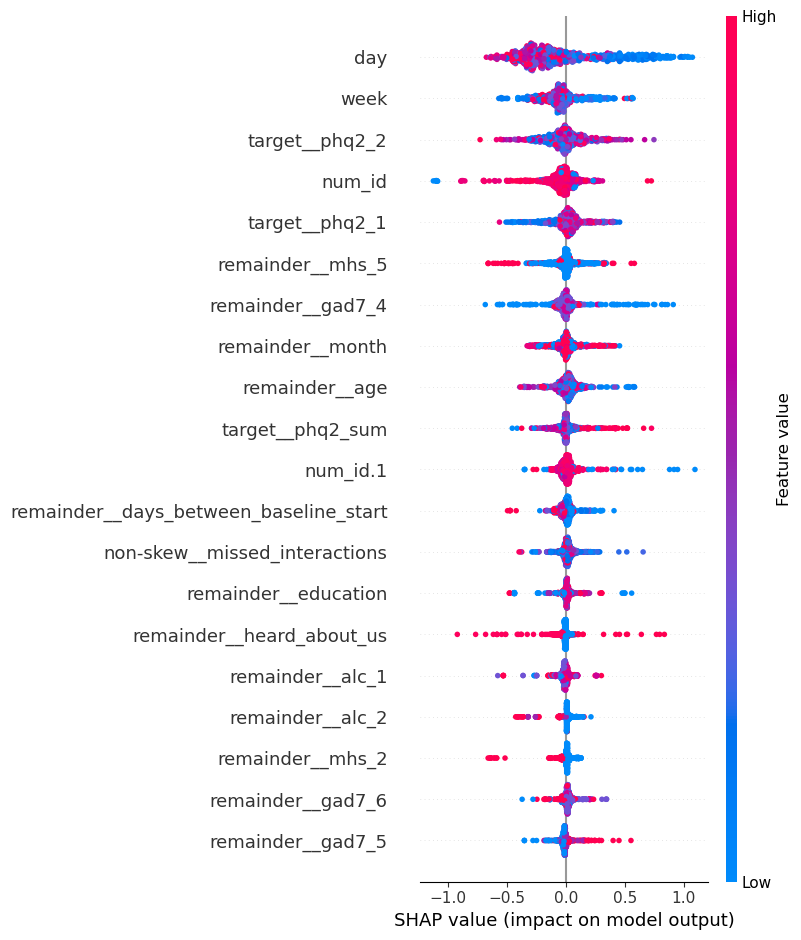

v1_week, Hist Gradient Tree
cv score: 0.084985, mae 0.764567 PMC: 0.339, p-val 0.000
cv score: 0.067367, mae 0.774629 PMC: 0.350, p-val 0.000
cv score: 0.207773, mae 0.684084 PMC: 0.467, p-val 0.000
cv score: -0.037630, mae 0.777329 PMC: 0.252, p-val 0.000
cv score: 0.093454, mae 0.788108 PMC: 0.334, p-val 0.000
R² on test for Hist Gradient Tree: -0.070, PMC: 0.168, p-val 0.000


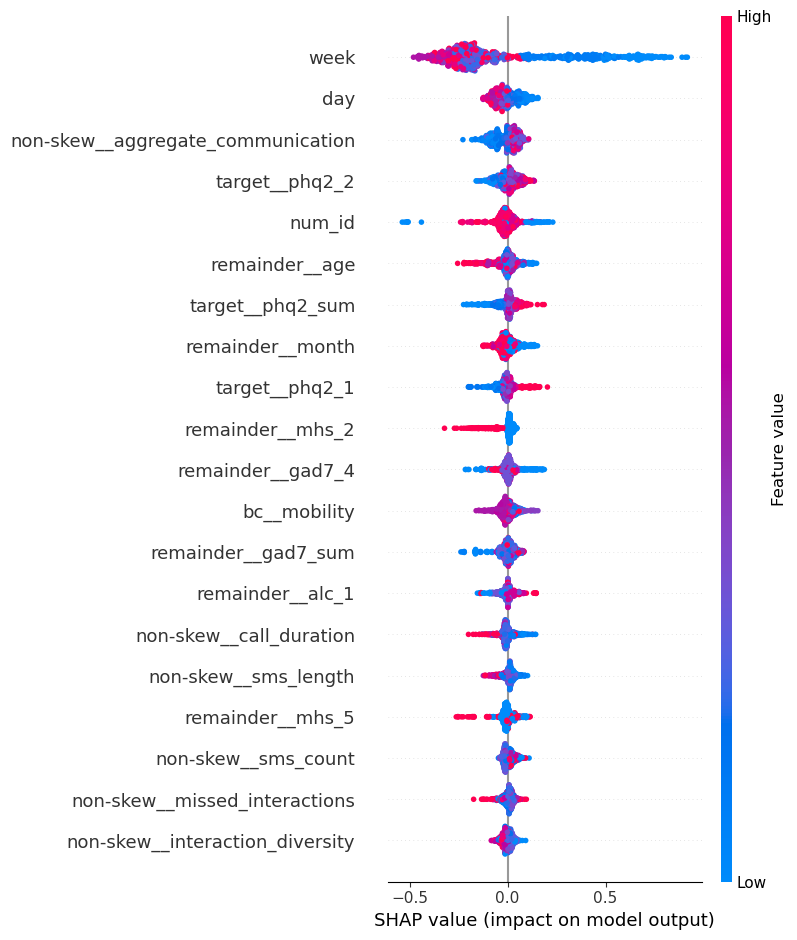

v1_week, Random Forest
cv score: 0.078897, mae 0.761426 PMC: 0.331, p-val 0.000
cv score: 0.107306, mae 0.762915 PMC: 0.363, p-val 0.000
cv score: 0.187602, mae 0.699074 PMC: 0.436, p-val 0.000
cv score: -0.012376, mae 0.770604 PMC: 0.252, p-val 0.000
cv score: 0.144250, mae 0.771215 PMC: 0.384, p-val 0.000
R² on test for Random Forest: -0.058, PMC: 0.164, p-val 0.000


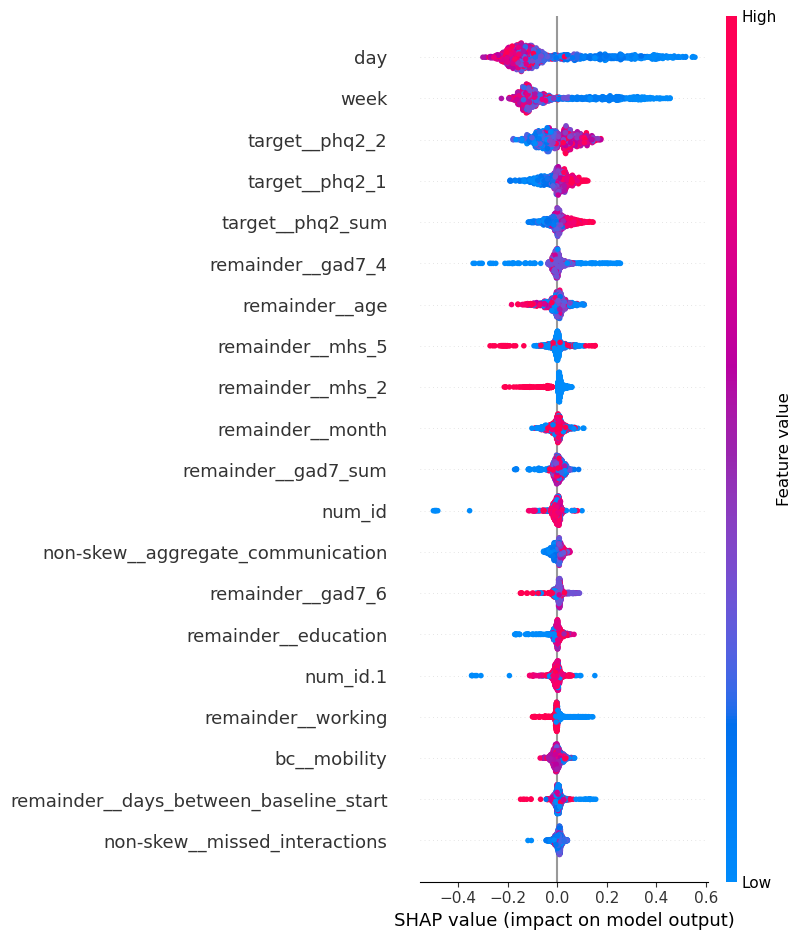

v1_week, XGBoost
cv score: -0.060468, mae 0.819696 PMC: 0.266, p-val 0.000
cv score: -0.039553, mae 0.830601 PMC: 0.300, p-val 0.000
cv score: 0.111867, mae 0.743100 PMC: 0.414, p-val 0.000
cv score: -0.155900, mae 0.838326 PMC: 0.201, p-val 0.000
cv score: 0.042279, mae 0.810385 PMC: 0.305, p-val 0.000
R² on test for XGBoost: -0.147, PMC: 0.149, p-val 0.000


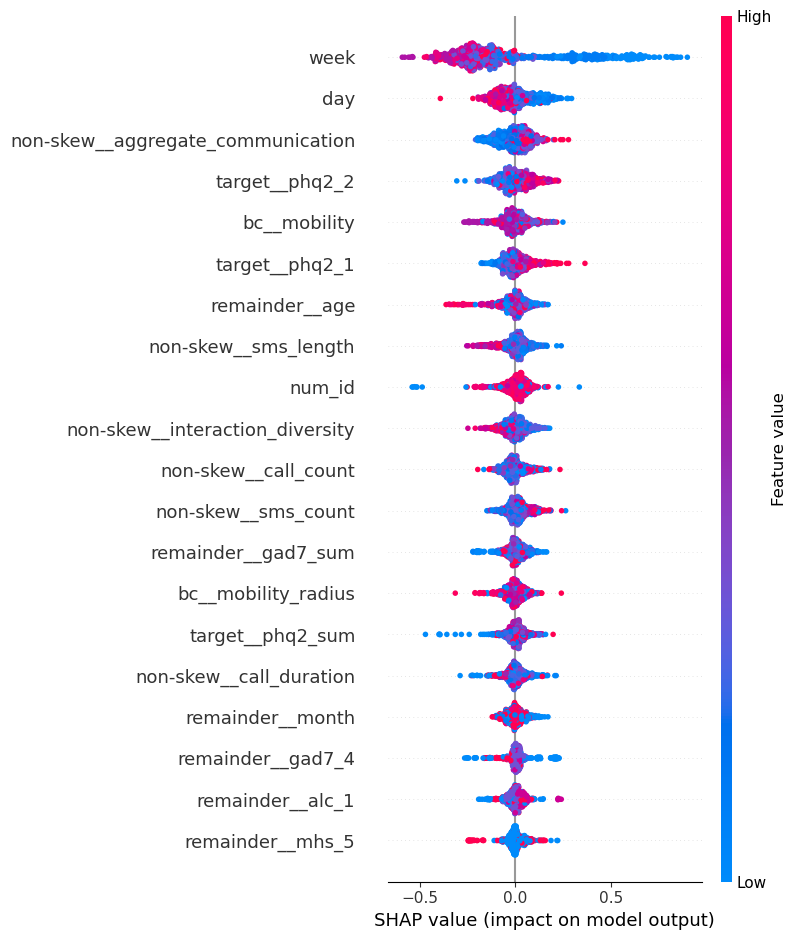

v1_week, AdaBoost
cv score: 0.140475, mae 0.761881 PMC: 0.392, p-val 0.000
cv score: 0.079535, mae 0.774114 PMC: 0.286, p-val 0.000
cv score: 0.192958, mae 0.700214 PMC: 0.471, p-val 0.000
cv score: 0.065558, mae 0.753061 PMC: 0.275, p-val 0.000
cv score: 0.152959, mae 0.769702 PMC: 0.394, p-val 0.000
R² on test for AdaBoost: 0.089, PMC: 0.306, p-val 0.000
v1_week, Gradient Boost
cv score: 0.134657, mae 0.749759 PMC: 0.379, p-val 0.000
cv score: 0.119895, mae 0.753390 PMC: 0.368, p-val 0.000
cv score: 0.218232, mae 0.686611 PMC: 0.473, p-val 0.000
cv score: 0.022914, mae 0.752561 PMC: 0.269, p-val 0.000
cv score: 0.157879, mae 0.755428 PMC: 0.399, p-val 0.000
R² on test for Gradient Boost: 0.016, PMC: 0.229, p-val 0.000


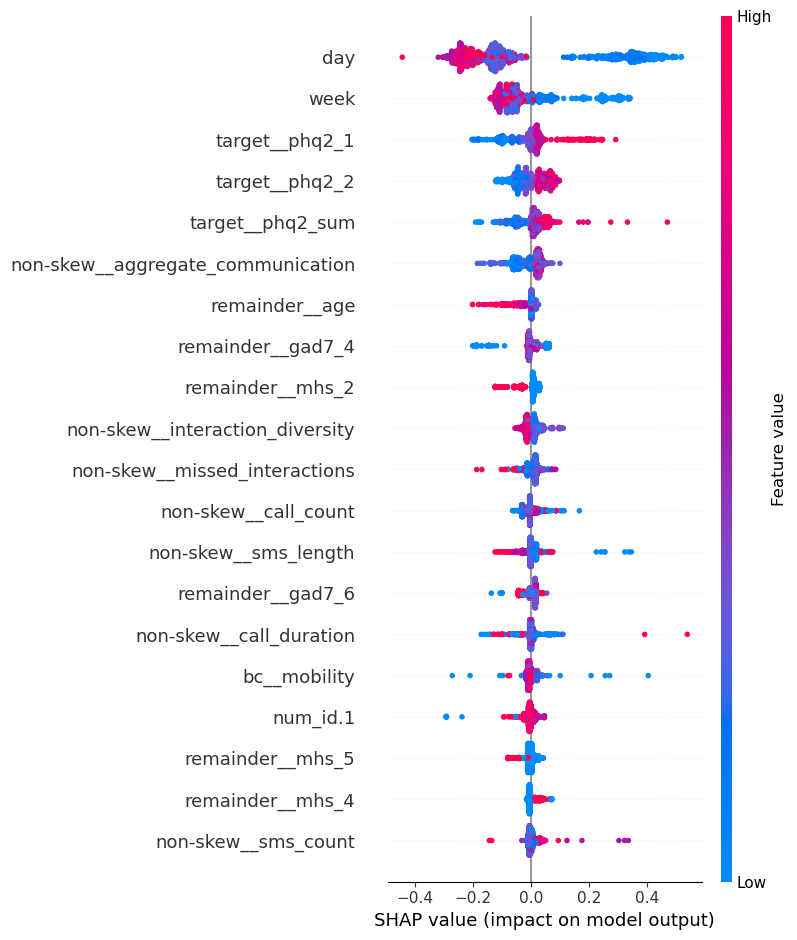

v1_week, Bagging
cv score: 0.008187, mae 0.792295 PMC: 0.286, p-val 0.000
cv score: 0.044288, mae 0.794350 PMC: 0.328, p-val 0.000
cv score: 0.131430, mae 0.716649 PMC: 0.390, p-val 0.000
cv score: -0.039402, mae 0.771051 PMC: 0.276, p-val 0.000
cv score: 0.104884, mae 0.788539 PMC: 0.368, p-val 0.000
R² on test for Bagging: -0.145, PMC: 0.115, p-val 0.000
v1_week, CatBoost
cv score: 0.126576, mae 0.737153 PMC: 0.382, p-val 0.000
cv score: 0.019986, mae 0.793776 PMC: 0.301, p-val 0.000
cv score: 0.218539, mae 0.696599 PMC: 0.471, p-val 0.000
cv score: -0.099962, mae 0.805215 PMC: 0.185, p-val 0.000
cv score: 0.127450, mae 0.769181 PMC: 0.370, p-val 0.000
R² on test for CatBoost: -0.079, PMC: 0.151, p-val 0.000


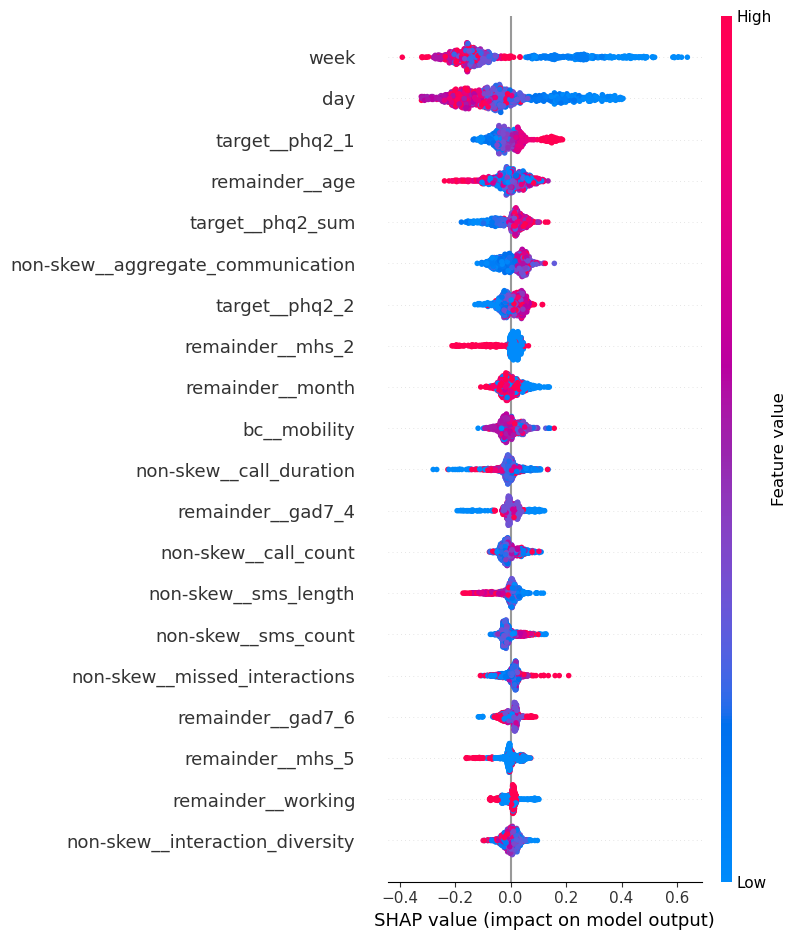

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_25901/4187037638.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_cov[y_col] = train[y_col]


Training shapes: y (2790,), X (2790, 78)
v2_week, Decision Tree
cv score: -0.984684, mae 1.130074 PMC: -0.034, p-val 0.420
cv score: -1.073518, mae 1.145967 PMC: -0.018, p-val 0.674
cv score: -1.282941, mae 1.123105 PMC: -0.050, p-val 0.234
cv score: -1.501867, mae 1.204522 PMC: -0.112, p-val 0.008
cv score: -1.016511, mae 1.162322 PMC: -0.009, p-val 0.838
R² on test for Decision Tree: -0.965, PMC: 0.017, p-val 0.704


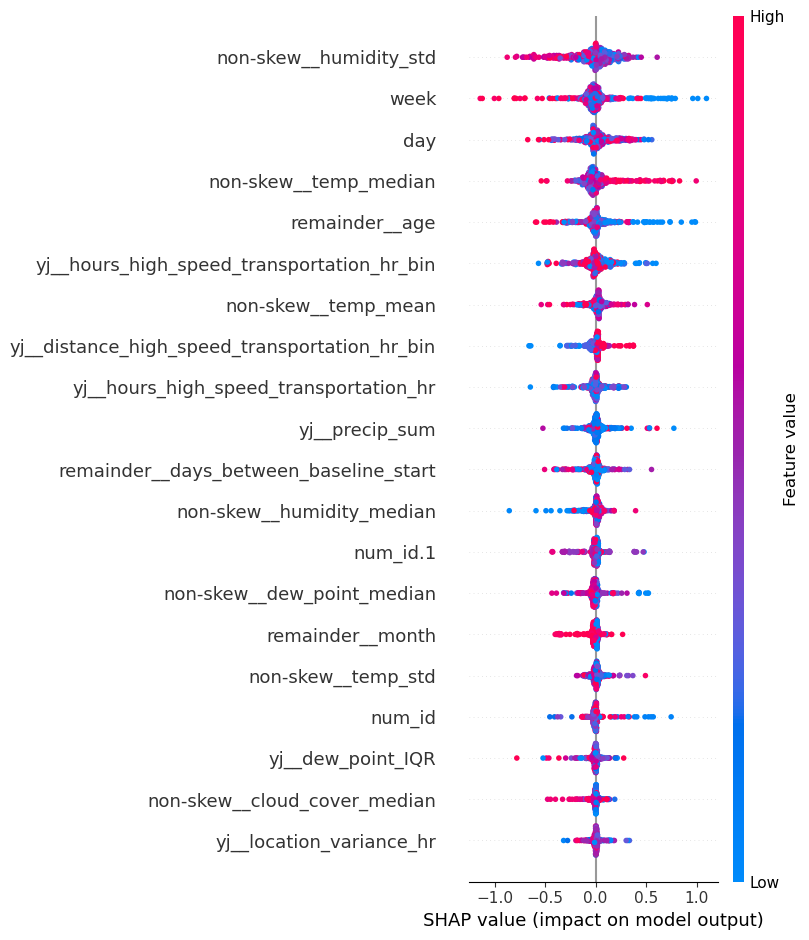

v2_week, Hist Gradient Tree
cv score: -0.174553, mae 0.890655 PMC: -0.087, p-val 0.041
cv score: -0.280973, mae 0.889979 PMC: -0.119, p-val 0.005
cv score: -0.157180, mae 0.817179 PMC: -0.031, p-val 0.466
cv score: -0.421348, mae 0.899822 PMC: -0.173, p-val 0.000
cv score: -0.128806, mae 0.886407 PMC: -0.008, p-val 0.855
R² on test for Hist Gradient Tree: -0.123, PMC: 0.027, p-val 0.551


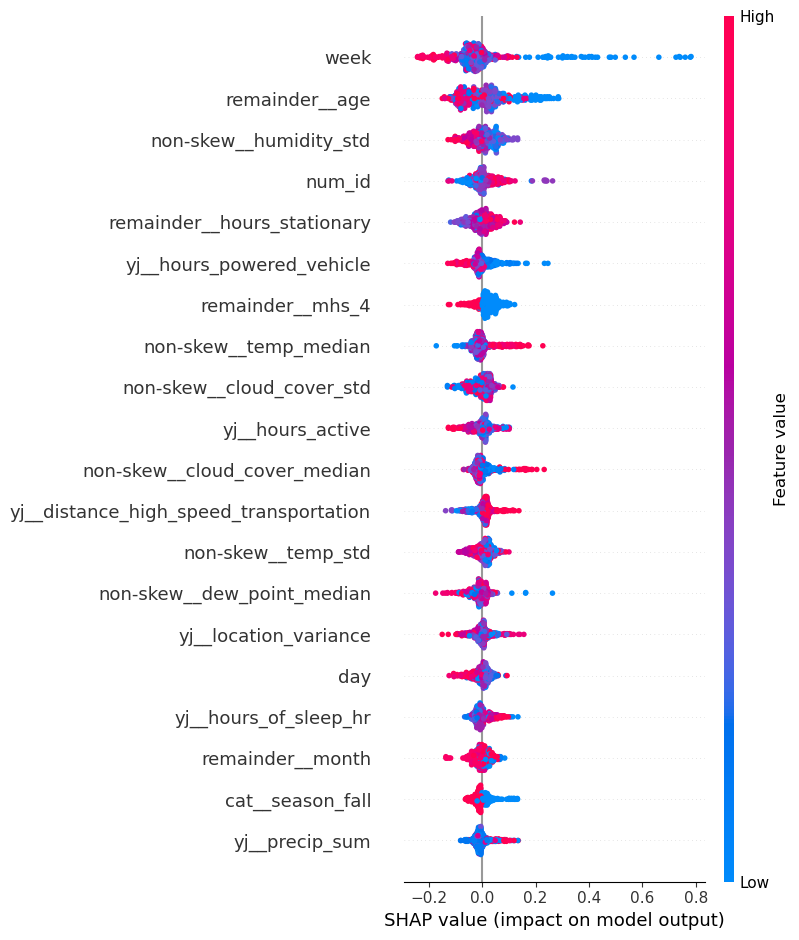

v2_week, Random Forest
cv score: -0.064622, mae 0.859913 PMC: -0.015, p-val 0.724
cv score: -0.123117, mae 0.839375 PMC: -0.014, p-val 0.735
cv score: -0.028761, mae 0.789170 PMC: 0.060, p-val 0.156
cv score: -0.152865, mae 0.811340 PMC: -0.093, p-val 0.028
cv score: -0.033421, mae 0.851423 PMC: 0.031, p-val 0.469
R² on test for Random Forest: -0.072, PMC: -0.024, p-val 0.592


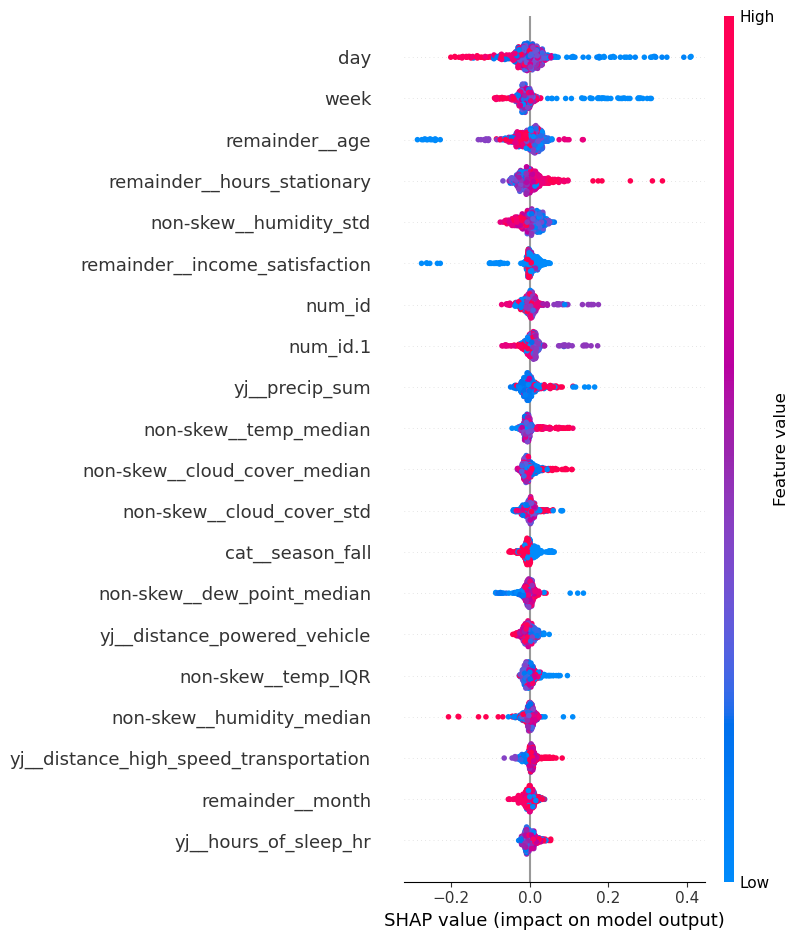

v2_week, XGBoost
cv score: -0.334285, mae 0.929703 PMC: -0.135, p-val 0.001
cv score: -0.311770, mae 0.891225 PMC: -0.076, p-val 0.073
cv score: -0.316080, mae 0.871930 PMC: -0.022, p-val 0.602
cv score: -0.463291, mae 0.918951 PMC: -0.091, p-val 0.032
cv score: -0.191842, mae 0.914504 PMC: 0.053, p-val 0.211
R² on test for XGBoost: -0.443, PMC: -0.140, p-val 0.002


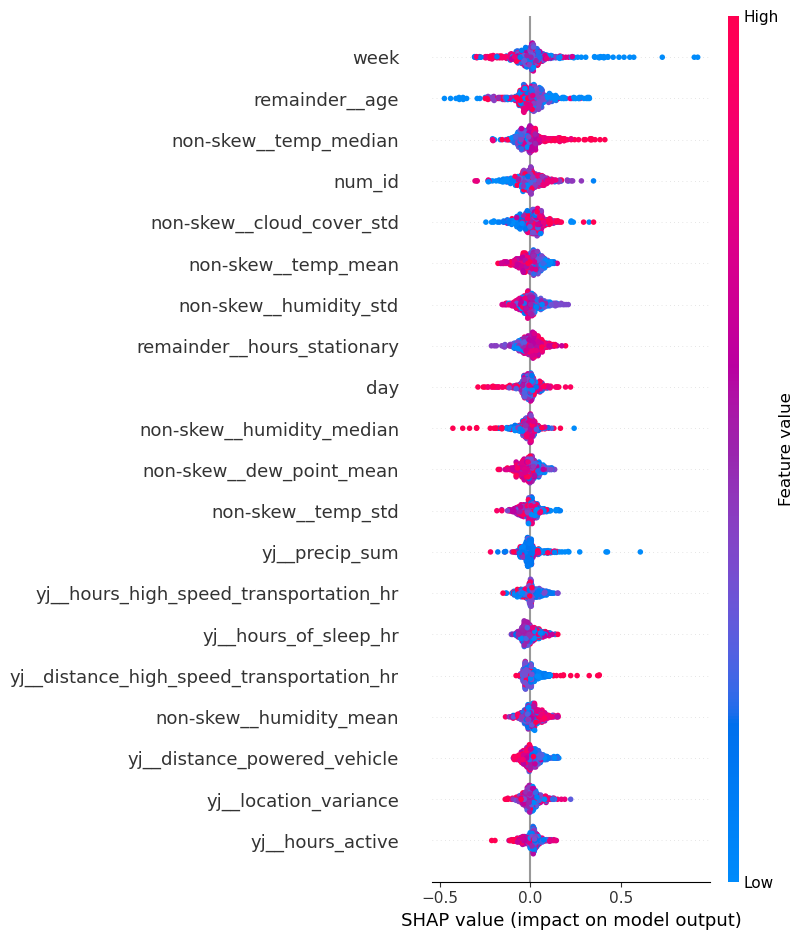

v2_week, AdaBoost
cv score: 0.008625, mae 0.843649 PMC: 0.097, p-val 0.022
cv score: -0.068141, mae 0.834142 PMC: -0.093, p-val 0.028
cv score: 0.013924, mae 0.767142 PMC: 0.131, p-val 0.002
cv score: -0.037916, mae 0.781693 PMC: -0.018, p-val 0.666
cv score: -0.001241, mae 0.839843 PMC: 0.054, p-val 0.198
R² on test for AdaBoost: 0.007, PMC: 0.092, p-val 0.043
v2_week, Gradient Boost
cv score: -0.051651, mae 0.853852 PMC: 0.021, p-val 0.625
cv score: -0.123115, mae 0.837033 PMC: -0.043, p-val 0.315
cv score: -0.060991, mae 0.800824 PMC: 0.009, p-val 0.835
cv score: -0.165250, mae 0.828112 PMC: -0.076, p-val 0.072
cv score: 0.000185, mae 0.832375 PMC: 0.107, p-val 0.012
R² on test for Gradient Boost: 0.010, PMC: 0.140, p-val 0.002


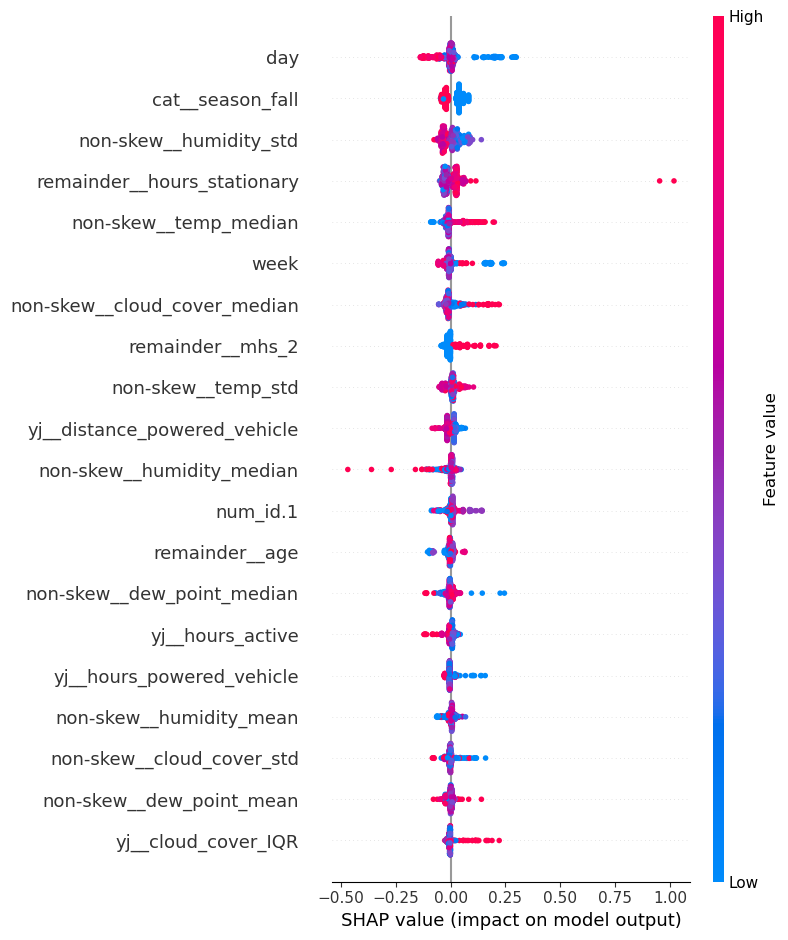

v2_week, Bagging
cv score: -0.090109, mae 0.854226 PMC: 0.053, p-val 0.213
cv score: -0.142355, mae 0.839920 PMC: 0.056, p-val 0.184
cv score: -0.099060, mae 0.805045 PMC: 0.057, p-val 0.177
cv score: -0.170192, mae 0.811451 PMC: 0.008, p-val 0.844
cv score: -0.134364, mae 0.883927 PMC: -0.009, p-val 0.829
R² on test for Bagging: -0.162, PMC: -0.029, p-val 0.529
v2_week, CatBoost
cv score: -0.165579, mae 0.879298 PMC: -0.104, p-val 0.014
cv score: -0.195267, mae 0.872266 PMC: -0.093, p-val 0.028
cv score: -0.029416, mae 0.775479 PMC: 0.145, p-val 0.001
cv score: -0.233687, mae 0.839379 PMC: -0.113, p-val 0.008
cv score: -0.104292, mae 0.878643 PMC: 0.004, p-val 0.928
R² on test for CatBoost: -0.212, PMC: -0.031, p-val 0.496


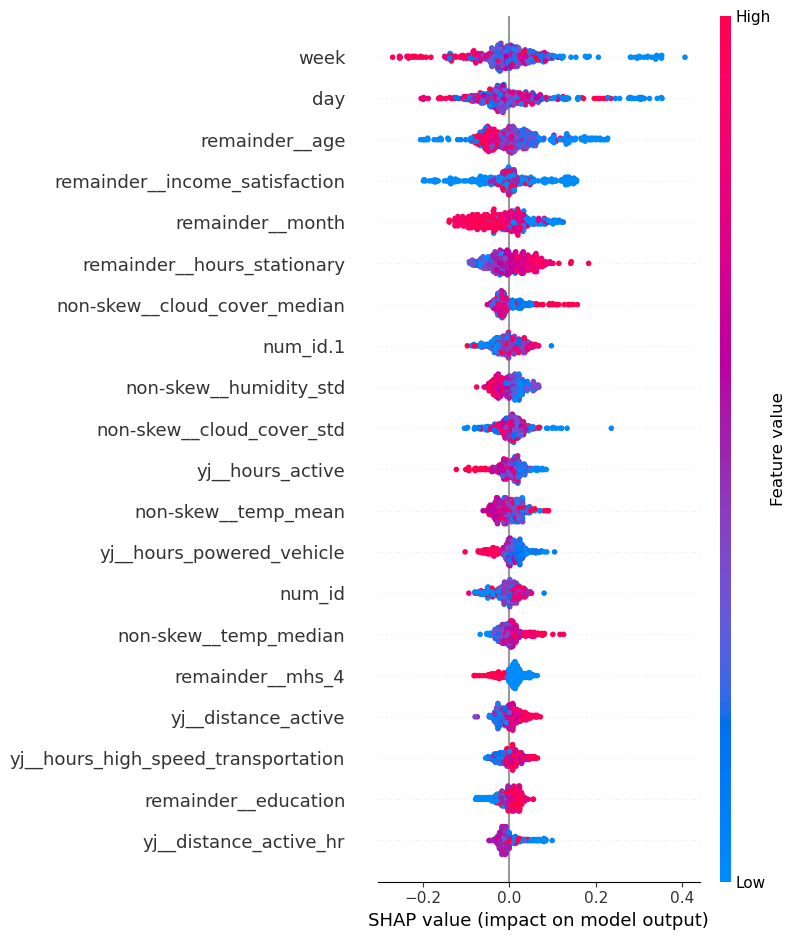

<Figure size 640x480 with 0 Axes>

In [2]:
cv_results = {}
test_results = {}
y_col = 'target__phq9_sum'


for name in ['v1_week','v2_week']:
    cv_results[name] = {}
    test_results[name] = {}
    train = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
    train = train.select_dtypes(include=('int64','float64'))
    train_cov = train.loc[:, train.notna().mean() > 0.7]
    if y_col not in train_cov.columns:
        train_cov[y_col] = train[y_col]
    train_full = train_cov.dropna()
    y_train = train_full[y_col].squeeze()
    X_train = train_full.drop(columns=[y_col]+[col for col in train_full.columns if 'phq9' in col or 'indicator' in col or '_nan' in col or 'Unnamed' in col])
    print(f'Training shapes: y {y_train.shape}, X {X_train.shape}')


    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups

    # Now drop all other id columns
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs:
        if 'SVM' in reg_name:
            continue
        print(f'{name}, {reg_name}')
        cv_results[name][reg_name] = {}
        test_results[name][reg_name] = {}

        cv_results[name][reg_name]['r2'] = []
        cv_results[name][reg_name]['mae'] = []
        cv_results[name][reg_name]['pmc'] = []
        test_results[name][reg_name]['r2'] = []
        test_results[name][reg_name]['mae'] = []
        test_results[name][reg_name]['pmc'] = []
        # 5 fold cross validation
        gkf = GroupKFold(n_splits=5)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train, y_train, groups=groups):
            X_tr, X_cv_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            
            reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
            # Predict on CV
            y_cv_val_pred = reg.predict(X_cv_val)
            # Evaluate r2 CV score
            cv_score = r2_score(y_cv_val, y_cv_val_pred)
            cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
            cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
            print(f'cv score: {cv_score:3f}, mae {cv_mae:3f} PMC: {cv_pmc[0]:.3f}, p-val {cv_pmc[1]:.3f}')
            cv_results[name][reg_name]['r2'].append(cv_score)
            cv_results[name][reg_name]['mae'].append(cv_mae)
            cv_results[name][reg_name]['pmc'].append(cv_pmc[0])

            


        
        # For that reg, predict test
        test = pd.read_csv(os.path.join(brighten_dir, f'{name}_test_transformed.csv'))
        test_cov = test[[col for col in train_full.columns]]
        test_full = test_cov.dropna()
        X_test = test_full.drop(columns=[y_col]+[col for col in test_full.columns if 'phq9' in col or 'indicator' in col or '_nan' in col or 'Unnamed' in col])
        y_test = test_full[y_col].squeeze()

        # Fit that reg
        reg.fit(X_train, y_train)
        y_val_pred = reg.predict(X_test)
        # Evaluate r2 test score
        test_score = r2_score(y_test, y_val_pred)
        test_mae = mean_absolute_error(y_test, y_val_pred)
        test_pmc = pearsonr(y_test, y_val_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}, PMC: {test_pmc[0]:.3f}, p-val {test_pmc[1]:.3f}')
        test_results[name][reg_name]['r2'].append(test_score)
        test_results[name][reg_name]['mae'].append(test_mae)
        test_results[name][reg_name]['pmc'].append(test_pmc[0])
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_test)
            shap.summary_plot(shap_values, X_test, show=False)
            plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_imputed.png"), bbox_inches="tight", dpi=300)
            plt.show()
            plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots






[{'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -1.2097192291012915},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.7132694940621338},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.826389499009966},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.6551036765376306},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.5170313697246478},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 1.1691059066167968},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 1.0178206268974281},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 1.0434726093308737},
 {'Dataset': 'v1_week',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 1.029635711853631},
 {'Dataset': 'v1_week',
  'Regressor': 

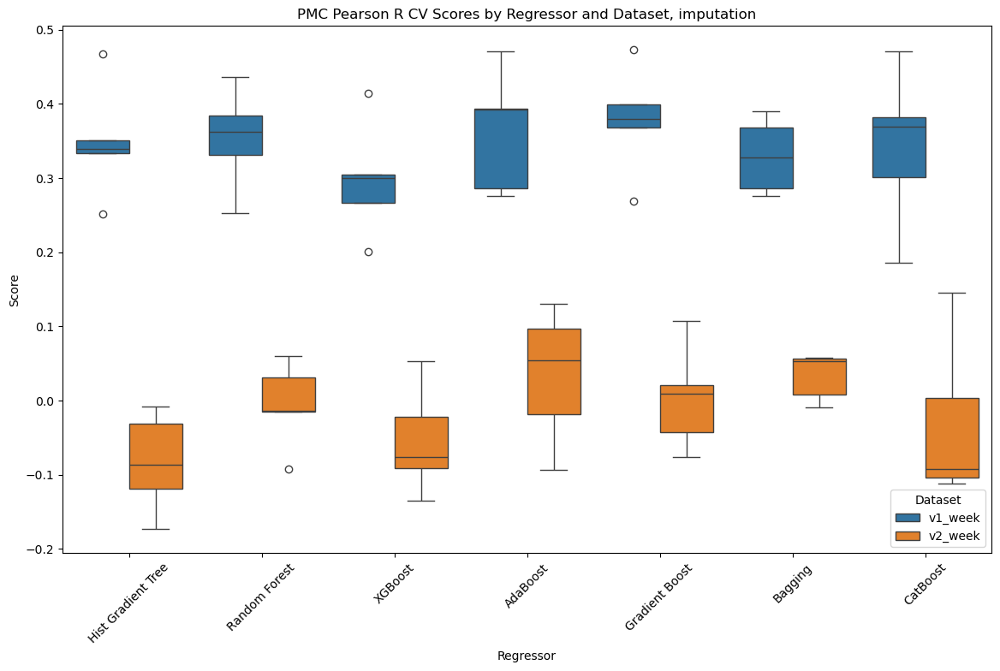

In [4]:
# Extract test data to flattened df for plotting
flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
flat_cv_results_df = pd.DataFrame(flat_cv_results)
flat_cv_results_df.to_csv(os.path.join(brighten_dir, 'flat_cv_results_df.csv'))
display(flat_cv_results)
plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=flat_cv_results_df[(flat_cv_results_df['Metric']=='pmc') & (flat_cv_results_df['Regressor']!='Decision Tree')])
plt.xticks(rotation=45)
plt.title('PMC Pearson R CV Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(cv_dir, 'PMC Pearson R CV Scores by Regressor and Dataset on _train dataset, imputed, before tuning.png'))
plt.show()


,v1_week,v2_week
Decision Tree,"{'r2': [-0.9552170028973246], 'mae': [1.144134...","{'r2': [-0.9654924012684518], 'mae': [1.093107..."
Hist Gradient Tree,"{'r2': [-0.07049241205234336], 'mae': [0.84284...","{'r2': [-0.12309091391453375], 'mae': [0.84608..."
Random Forest,"{'r2': [-0.05764996241198905], 'mae': [0.82556...","{'r2': [-0.0722525155168392], 'mae': [0.811422..."
XGBoost,"{'r2': [-0.14667420667708564], 'mae': [0.87229...","{'r2': [-0.44339041383277444], 'mae': [0.92553..."
AdaBoost,"{'r2': [0.08888855952671693], 'mae': [0.764947...","{'r2': [0.00687063251000275], 'mae': [0.780729..."
Gradient Boost,"{'r2': [0.016433986161092262], 'mae': [0.80345...","{'r2': [0.010393518219887987], 'mae': [0.78528..."
Bagging,"{'r2': [-0.14539868465208583], 'mae': [0.85992...","{'r2': [-0.1619940349704594], 'mae': [0.850160..."
CatBoost,"{'r2': [-0.0787861118931088], 'mae': [0.849786...","{'r2': [-0.21189413316900607], 'mae': [0.84828..."


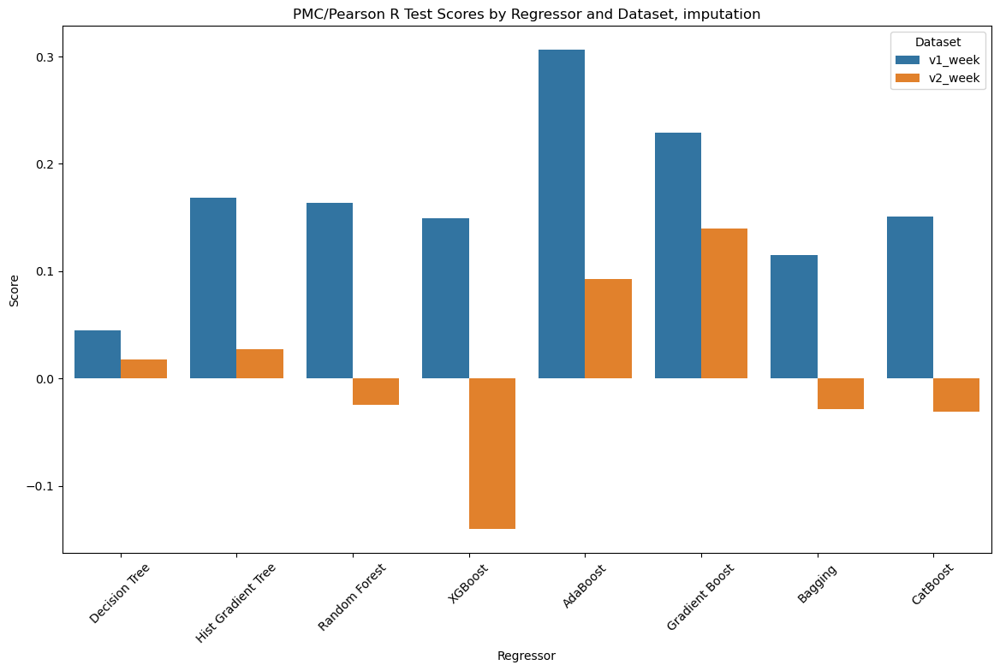

In [6]:
test_results_df = pd.DataFrame(test_results)
test_results_df.to_csv(os.path.join(brighten_dir, 'test_results_df.csv'))
display(test_results_df)


# Extract test data to flattened df for plotting
flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
flat_test_results_df = pd.DataFrame(flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=flat_test_results_df[flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('PMC/Pearson R Test Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(val_dir, 'PMC Pearson R Test Scores by Regressor and Dataset on _val dataset, imputed, before tuning.png'))
plt.show()


In [ ]:
# results_df_grouped_imp = flat_test_results_df.groupby(['Dataset', 'Regressor','Metric']).agg('mean')
# display(results_df_grouped_imp.head())
# results_df_grouped_imp.to_csv(os.path.join(brighten_dir, 'test_score_df_imputed'))

Score
Dataset Regressor Metric          
v1_day  AdaBoost  mae     0.881925
                  r2     -0.036655
        Bagging   mae     0.518977
                  r2      0.377353
        CatBoost  mae     0.633289

Training shapes: y (8457,), X (8457, 77)
Training shapes: y (8457,), X (8457, 77)
R² on test for Hist Gradient Boost: -0.085


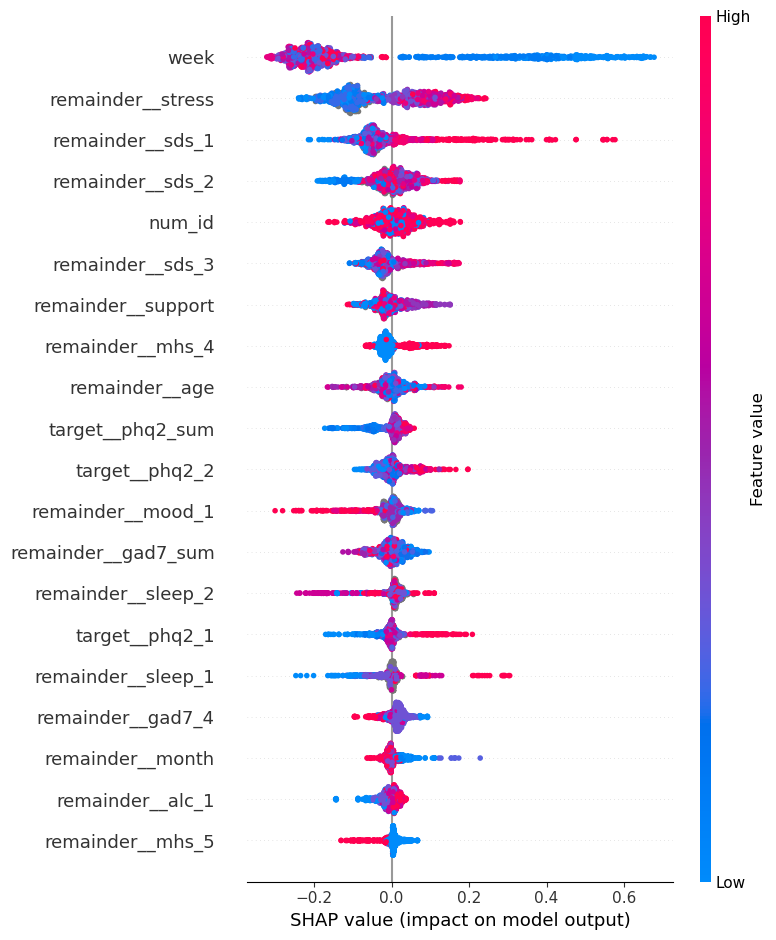

R² on test for XGBoost: -0.123


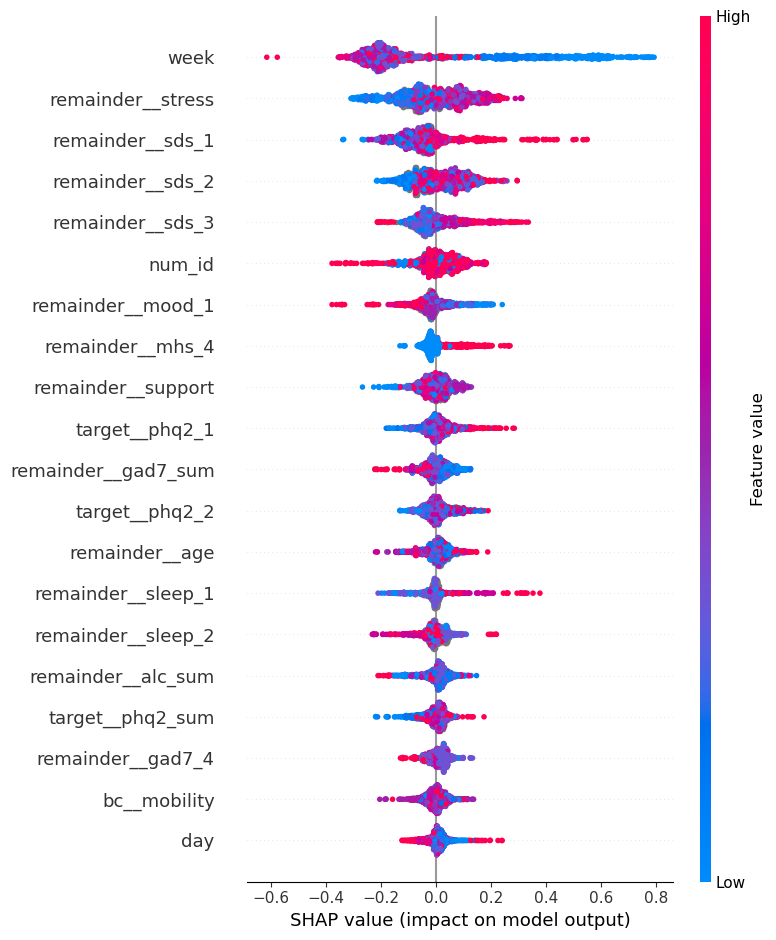

R² on test for CatBoost: -0.080


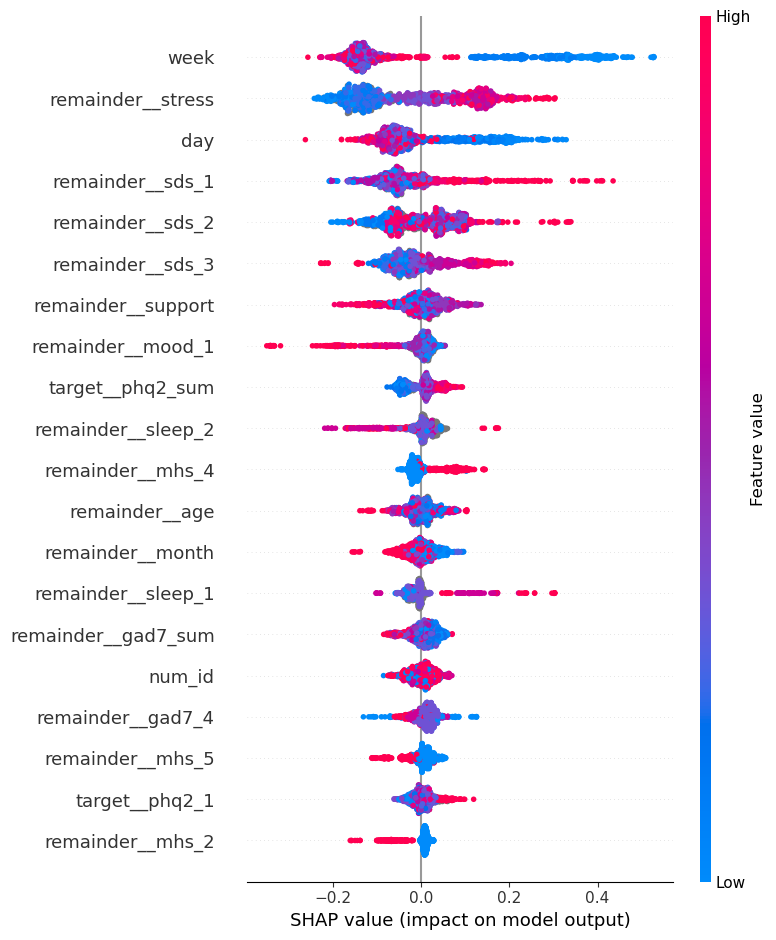

Training shapes: y (4763,), X (4763, 121)
Training shapes: y (4763,), X (4763, 121)
R² on test for Hist Gradient Boost: -0.041


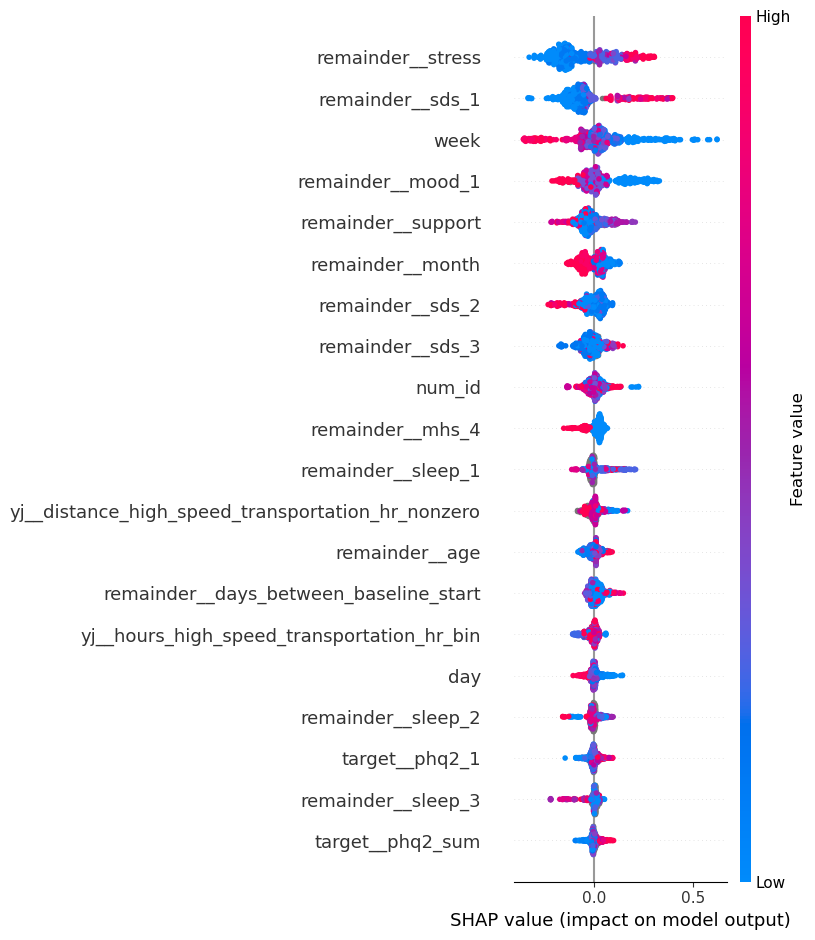

R² on test for XGBoost: -0.087


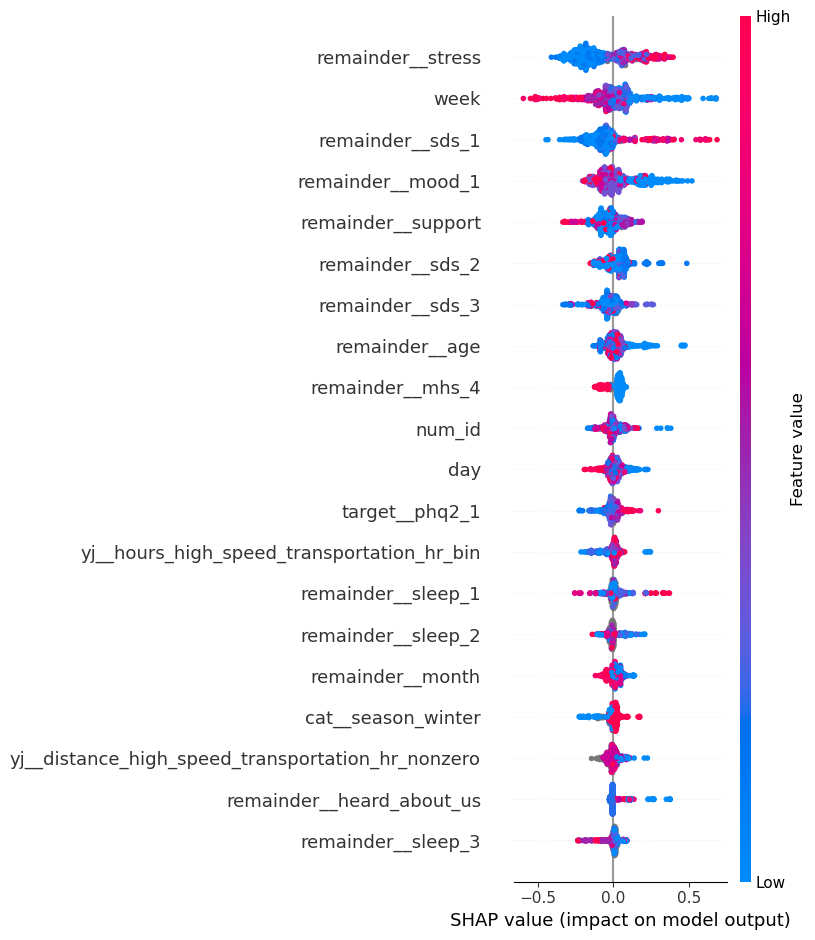

R² on test for CatBoost: 0.029


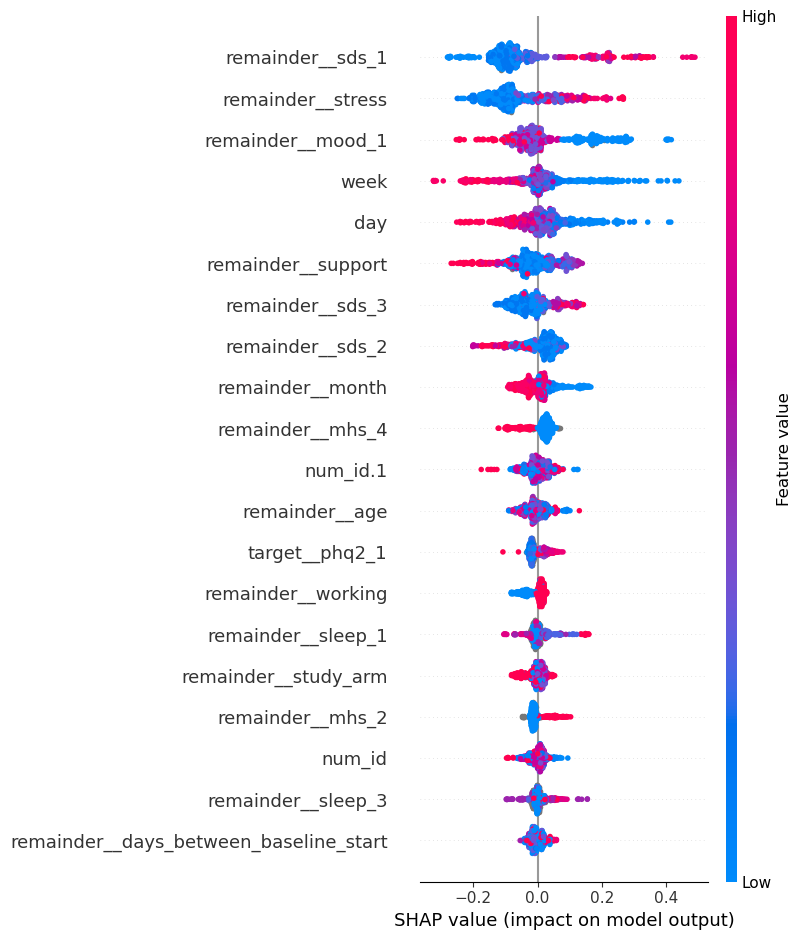

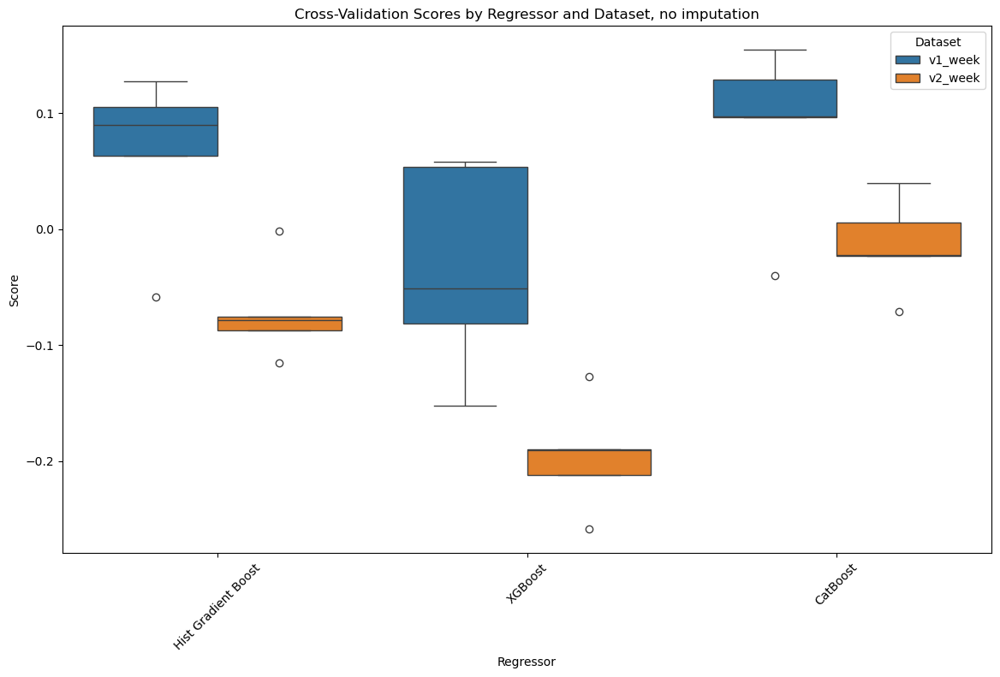

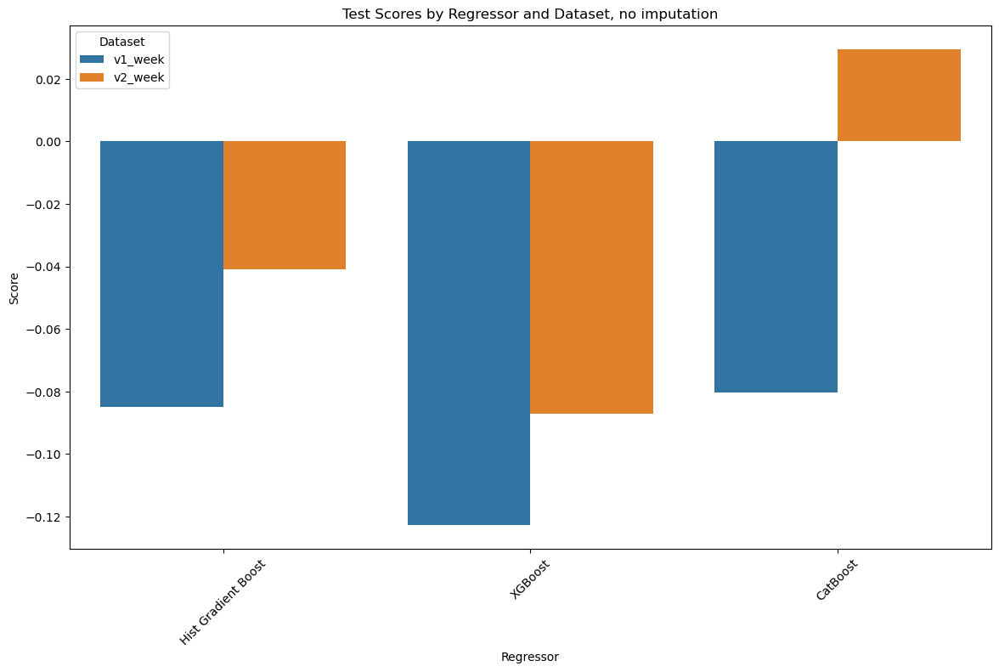

In [11]:
# no mae
from sklearn.model_selection import GroupKFold, cross_val_score
id_columns.append('idx')
wNA_cv_results = {}
wNA_test_results = {}
y_col = 'target__phq9_sum'

for name in ['v1_week','v2_week']:
    wNA_cv_results[name] = {}
    wNA_test_results[name] = {}
    train = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
    train = train.select_dtypes(include=('int64','float64'))
    train = train.dropna(subset=y_col).drop(columns=[col for col in train.columns if col in ['cat__race_1.0', 'cat__race_7.0', 'yj__hours_high_speed_transportation_hr_nonzero']])
    y_train = train[y_col].squeeze()
    X_train = train.drop(columns=[y_col]+[col for col in train.columns if 'phq9' in col or 'indicator' in col or '_nan' in col or 'Unnamed' in col])
    print(f'Training shapes: y {y_train.shape}, X {X_train.shape}')

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    print(f'Training shapes: y {y_train.shape}, X {X_train.shape}')
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs_someNA:
        wNA_cv_results[name][reg_name] = []
        wNA_test_results[name][reg_name] = []
        # 5 fold cross validation
        gkf = GroupKFold(n_splits=5)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train, y_train, groups=groups):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            
            reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
            # Predict on CV
            y_val_pred = reg.predict(X_val)
            # Evaluate r2 CV score
            cv_score = r2_score(y_val, y_val_pred)
            wNA_cv_results[name][reg_name].append(cv_score)
        
        # For that reg, predict test
        test = pd.read_csv(os.path.join(brighten_dir, f'{name}_test_transformed.csv'))
        test = test.select_dtypes(include=('int64','float64'))
        test = test.dropna(subset=y_col)
        y_test = test[y_col].squeeze()
        X_test = test.drop(columns=[y_col]+[col for col in test.columns if 'phq9' in col or 'indicator' in col or '_nan' in col or 'Unnamed' in col])
        # Fit that reg
        reg.fit(X_train, y_train)
        X_test = X_test[X_train.columns]
        y_test_pred = reg.predict(X_test)
        # Evaluate r2 test score
        test_score = r2_score(y_test, y_test_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}')
        wNA_test_results[name][reg_name].append(test_score)
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_test)
            shap.summary_plot(shap_values, X_test)


# Extract CV data to flattened df for plotting
wNA_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_cv_results.items():
    # iterate over the scores within it
    for reg_name, scores in reg_results.items():
        for score in scores:
            wNA_flat_cv_results.append({
                'Dataset': dataset_name,
                'Regressor': reg_name,
                'Score': score
            })


wNA_cv_results_df = pd.DataFrame(wNA_flat_cv_results)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=wNA_cv_results_df)
plt.xticks(rotation=45)
plt.title('Cross-Validation Scores by Regressor and Dataset, no imputation')
plt.show()



# Extract test data to flattened df for plotting
wNA_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_test_results.items():
    # iterate over the scores within it
    for reg_name, scores in reg_results.items():
        for score in scores:
            wNA_flat_test_results.append({
                'Dataset': dataset_name,
                'Regressor': reg_name,
                'Score': score
            })


test_results_df = pd.DataFrame(wNA_flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=test_results_df)
plt.xticks(rotation=45)
plt.title('Test Scores by Regressor and Dataset, no imputation')
plt.show()


Training shapes: y (8457,), X (8457, 77)
Training shapes: y (8457,), X (8457, 77)
v1_day, Hist Gradient Boost
cv score: -0.009, mae 0.782, pmc: 0.284
cv score: 0.059, mae 0.774, pmc: 0.345
cv score: 0.072, mae 0.761, pmc: 0.340
R² on test for Hist Gradient Boost: -0.085, PMC: 0.180


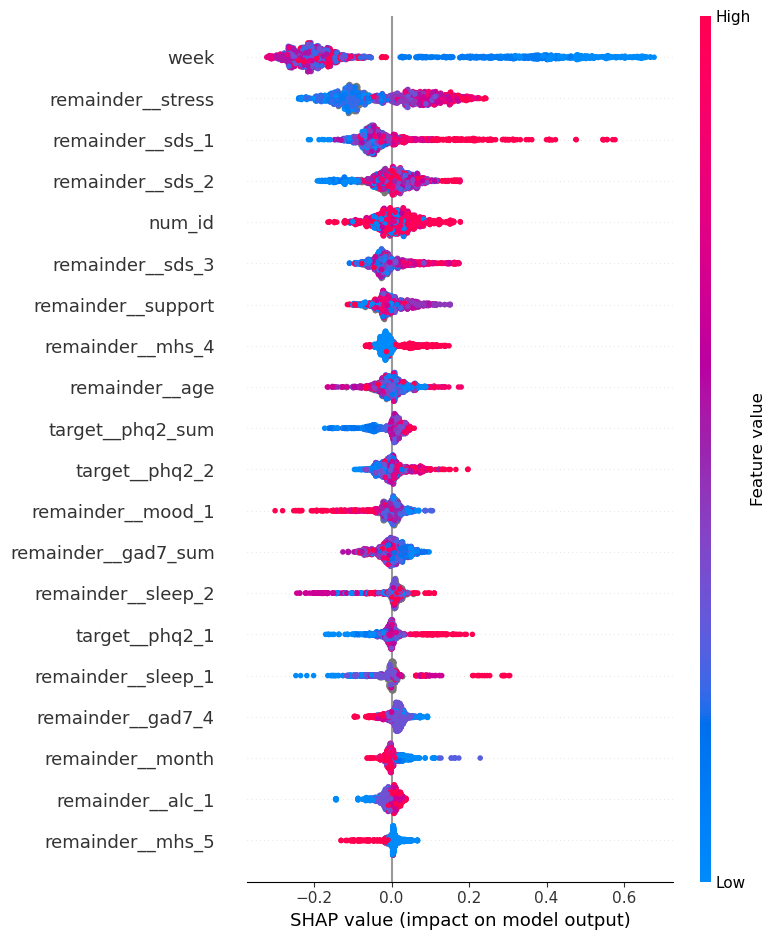

v1_day, XGBoost
cv score: -0.149, mae 0.826, pmc: 0.248
cv score: -0.091, mae 0.829, pmc: 0.271
cv score: -0.023, mae 0.802, pmc: 0.302
R² on test for XGBoost: -0.123, PMC: 0.181


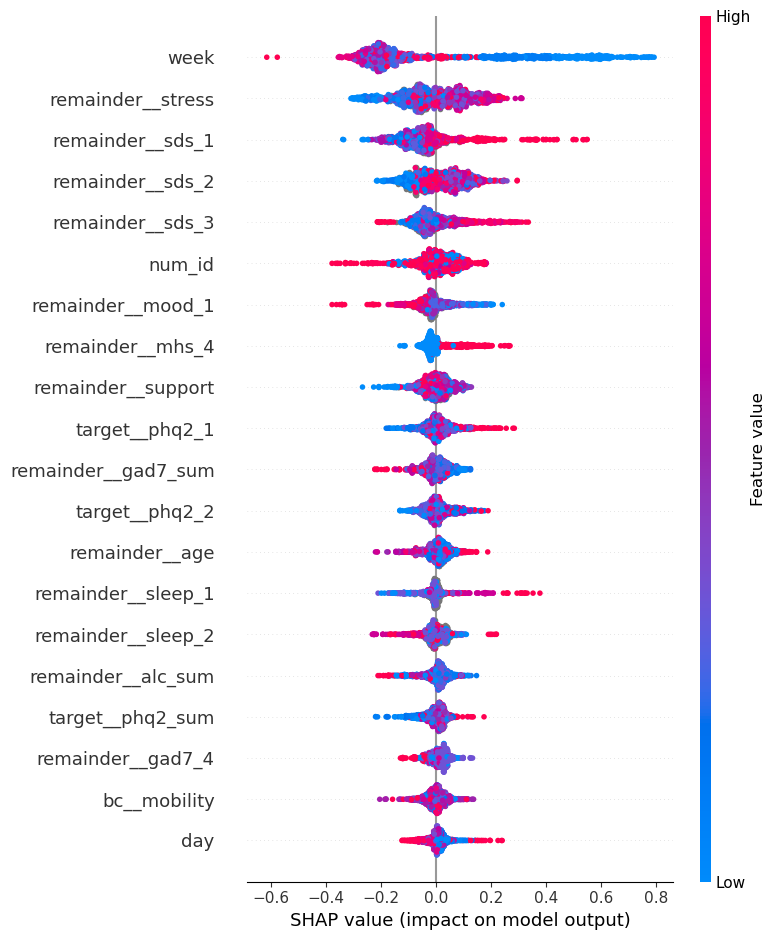

v1_day, CatBoost
cv score: 0.004, mae 0.767, pmc: 0.304
cv score: 0.093, mae 0.770, pmc: 0.364
cv score: 0.111, mae 0.748, pmc: 0.366
R² on test for CatBoost: -0.080, PMC: 0.181


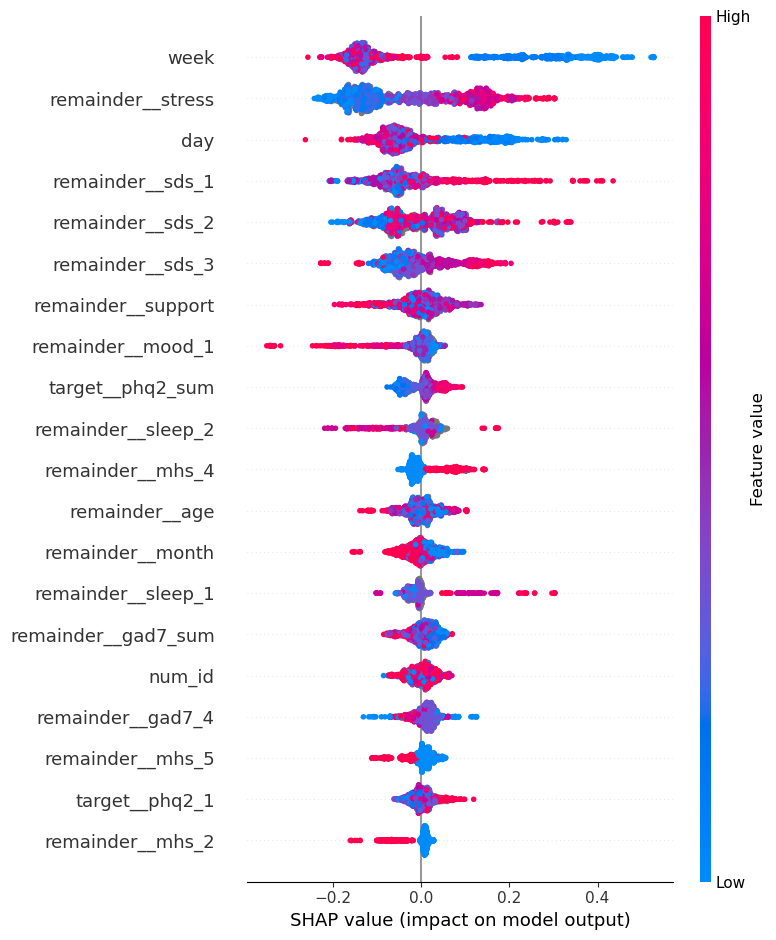

Training shapes: y (4763,), X (4763, 121)
Training shapes: y (4763,), X (4763, 121)
v2_day, Hist Gradient Boost
cv score: -0.129, mae 0.846, pmc: 0.150
cv score: -0.039, mae 0.802, pmc: 0.223
cv score: -0.063, mae 0.800, pmc: 0.174
R² on test for Hist Gradient Boost: -0.041, PMC: 0.183


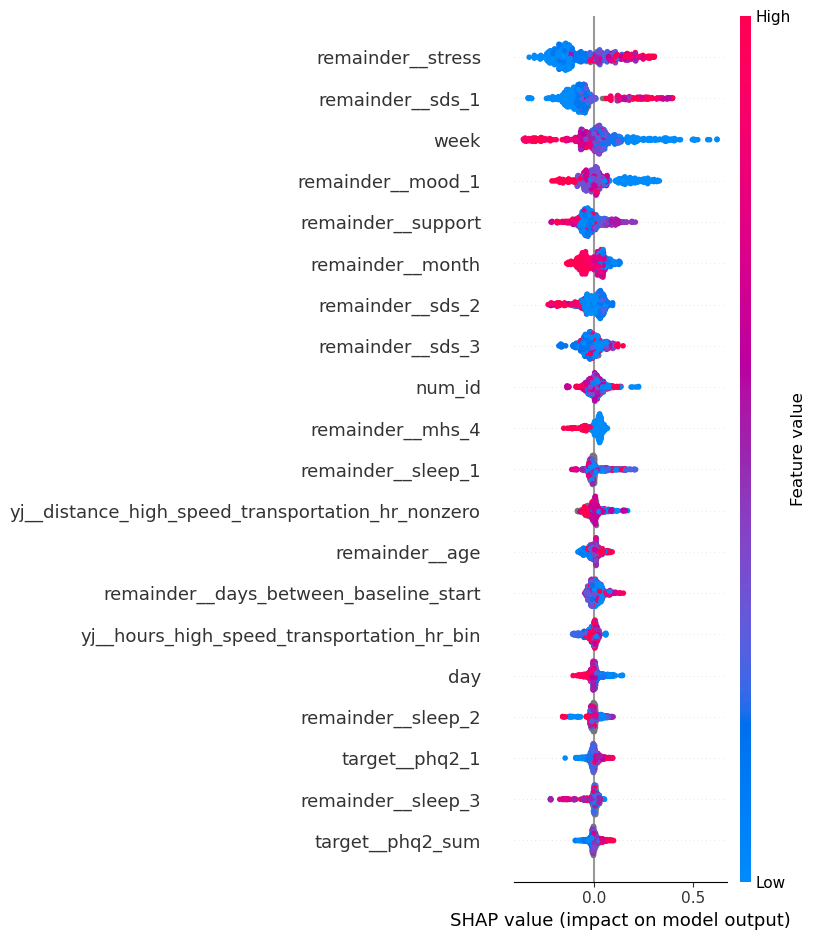

v2_day, XGBoost
cv score: -0.223, mae 0.884, pmc: 0.109
cv score: -0.095, mae 0.808, pmc: 0.220
cv score: -0.182, mae 0.838, pmc: 0.123
R² on test for XGBoost: -0.087, PMC: 0.240


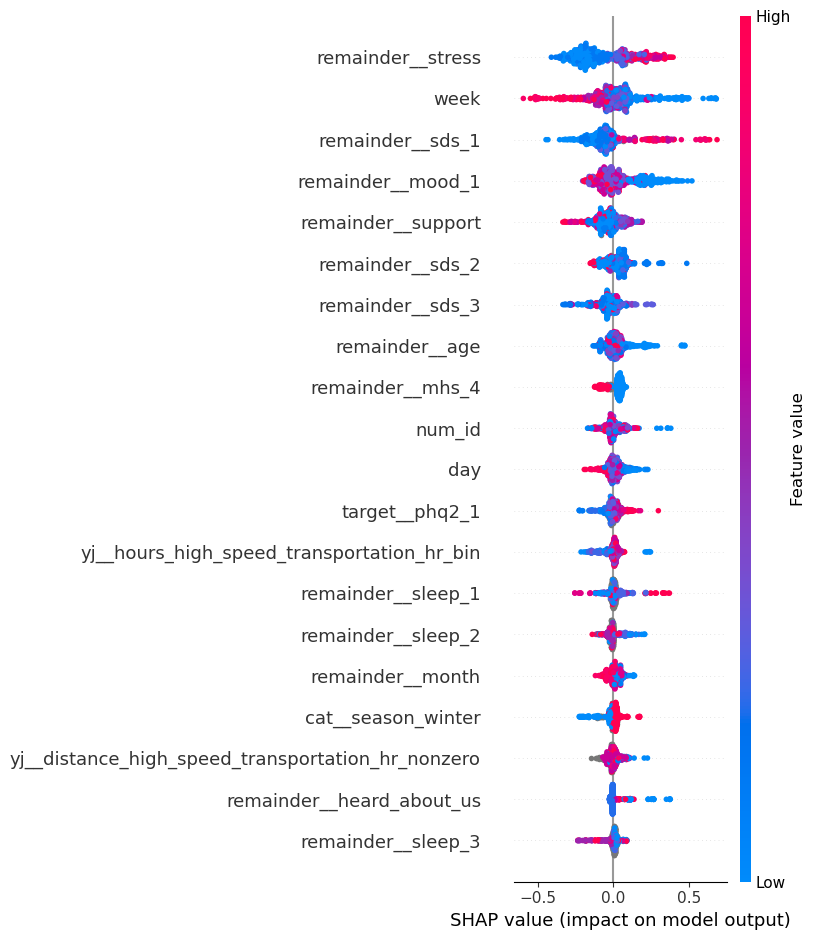

v2_day, CatBoost
cv score: -0.089, mae 0.838, pmc: 0.156
cv score: 0.000, mae 0.786, pmc: 0.240
cv score: -0.051, mae 0.794, pmc: 0.158
R² on test for CatBoost: 0.029, PMC: 0.256


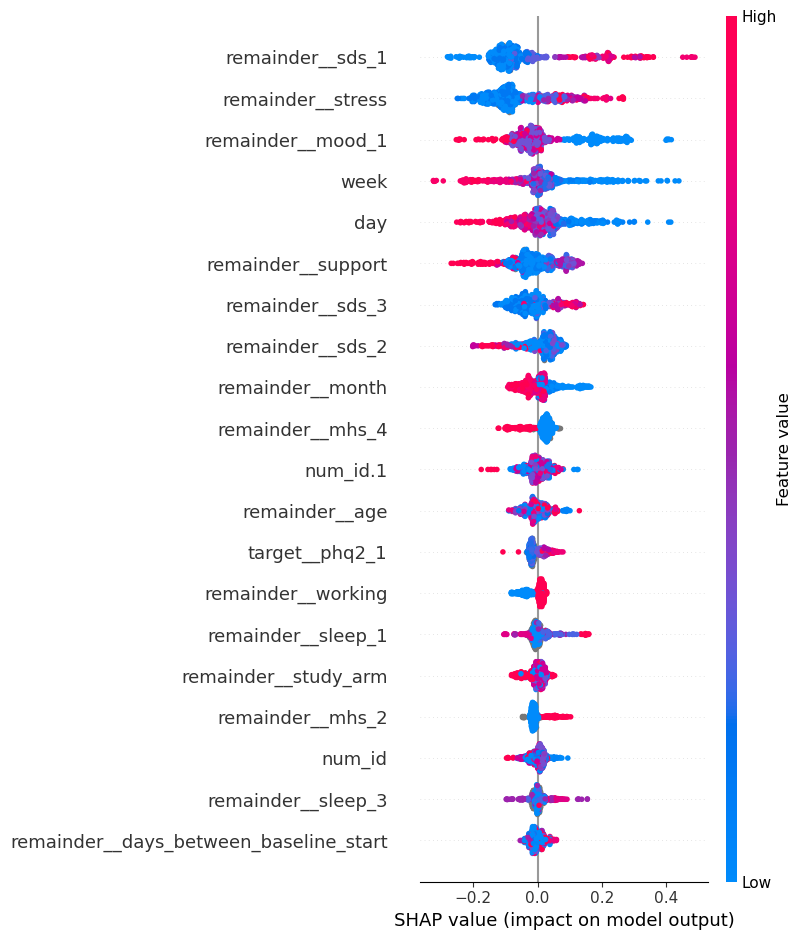

Training shapes: y (8457,), X (8457, 77)
Training shapes: y (8457,), X (8457, 77)
v1_week, Hist Gradient Boost
cv score: -0.009, mae 0.782, pmc: 0.284
cv score: 0.059, mae 0.774, pmc: 0.345
cv score: 0.072, mae 0.761, pmc: 0.340
R² on test for Hist Gradient Boost: -0.085, PMC: 0.180


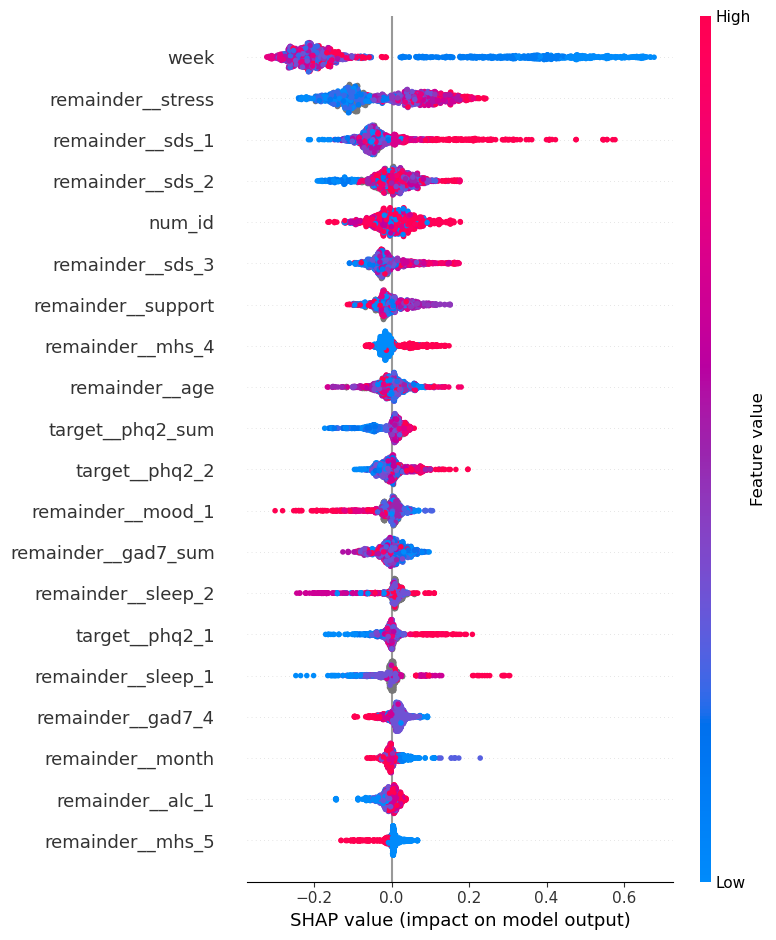

v1_week, XGBoost
cv score: -0.149, mae 0.826, pmc: 0.248
cv score: -0.091, mae 0.829, pmc: 0.271
cv score: -0.023, mae 0.802, pmc: 0.302
R² on test for XGBoost: -0.123, PMC: 0.181


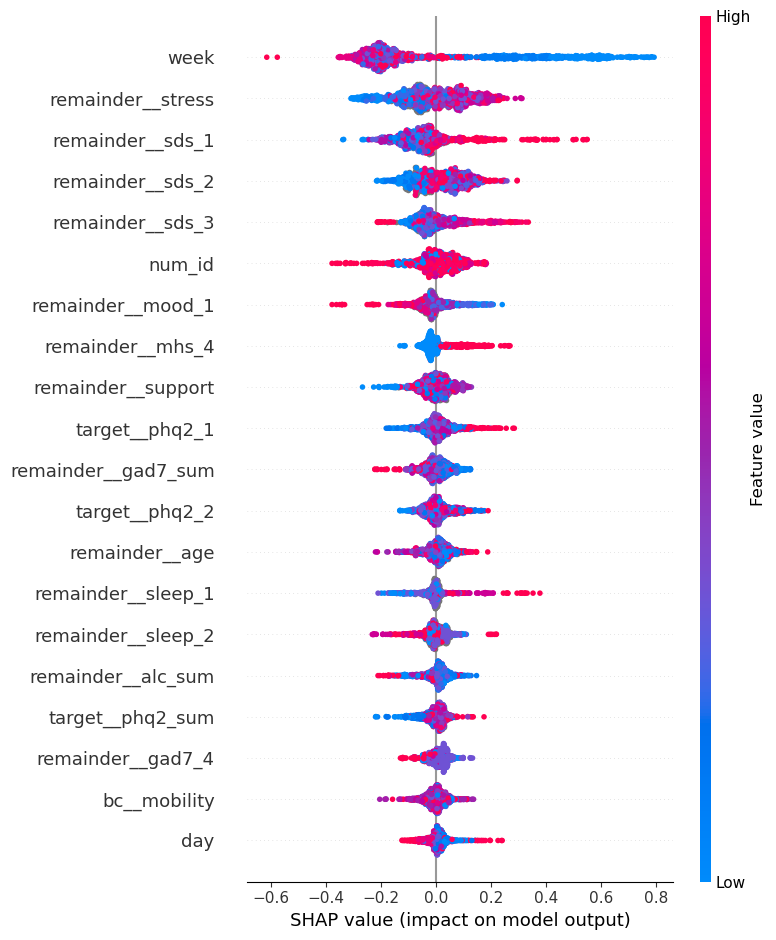

v1_week, CatBoost
cv score: 0.004, mae 0.767, pmc: 0.304
cv score: 0.093, mae 0.770, pmc: 0.364
cv score: 0.111, mae 0.748, pmc: 0.366
R² on test for CatBoost: -0.080, PMC: 0.181


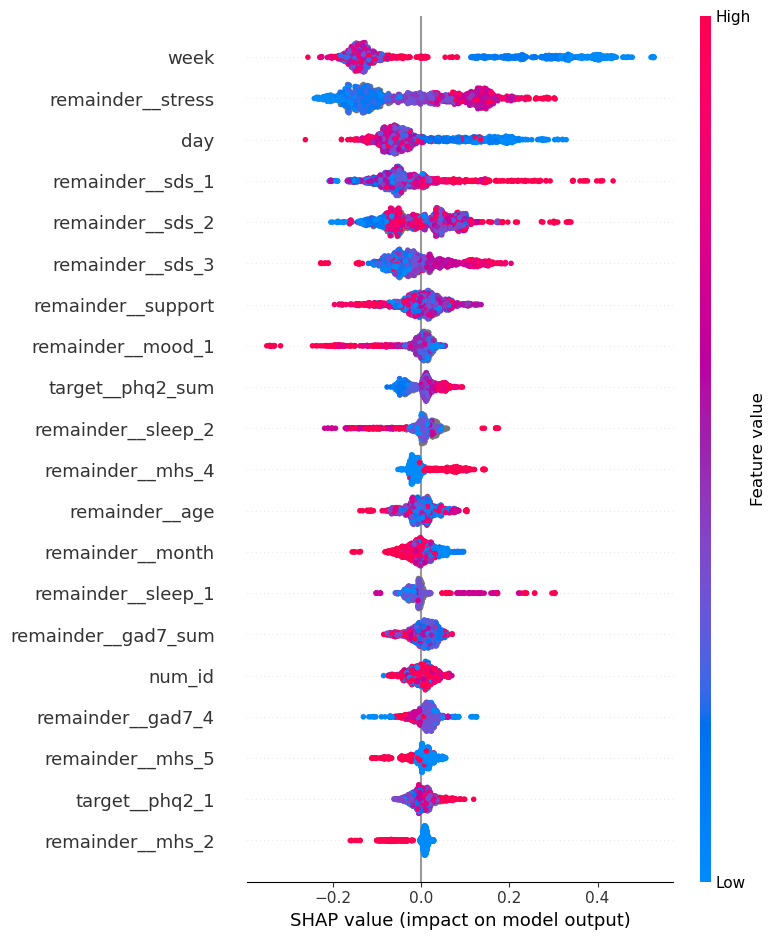

Training shapes: y (4763,), X (4763, 121)
Training shapes: y (4763,), X (4763, 121)
v2_week, Hist Gradient Boost
cv score: -0.129, mae 0.846, pmc: 0.150
cv score: -0.039, mae 0.802, pmc: 0.223
cv score: -0.063, mae 0.800, pmc: 0.174
R² on test for Hist Gradient Boost: -0.041, PMC: 0.183


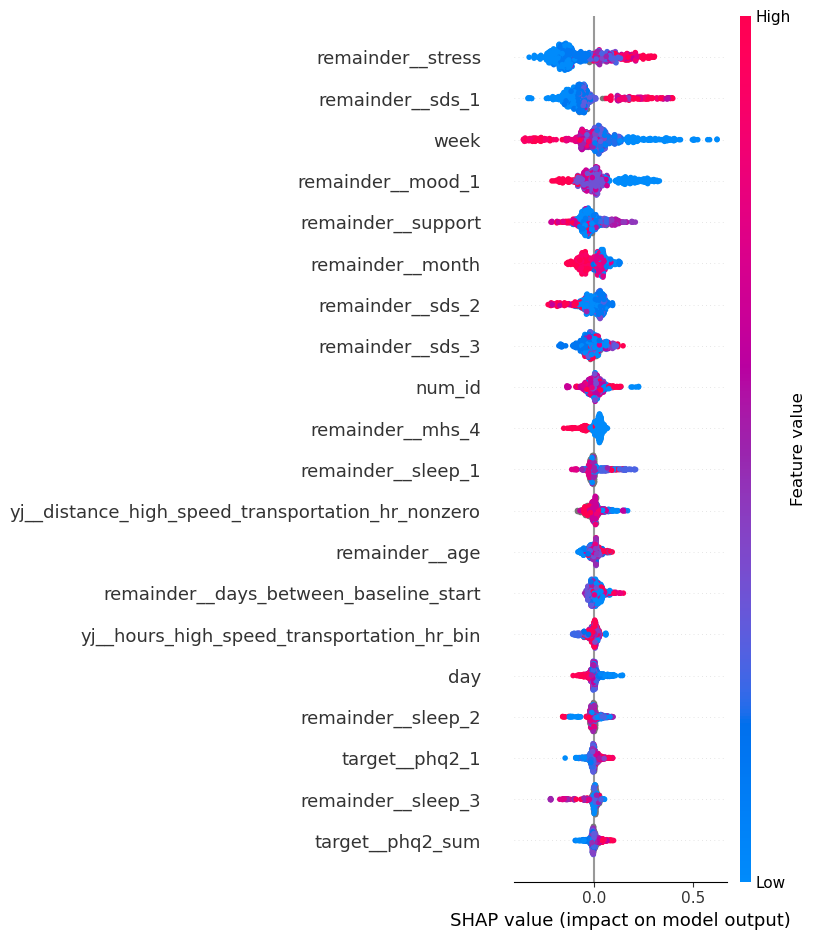

v2_week, XGBoost
cv score: -0.223, mae 0.884, pmc: 0.109
cv score: -0.095, mae 0.808, pmc: 0.220
cv score: -0.182, mae 0.838, pmc: 0.123
R² on test for XGBoost: -0.087, PMC: 0.240


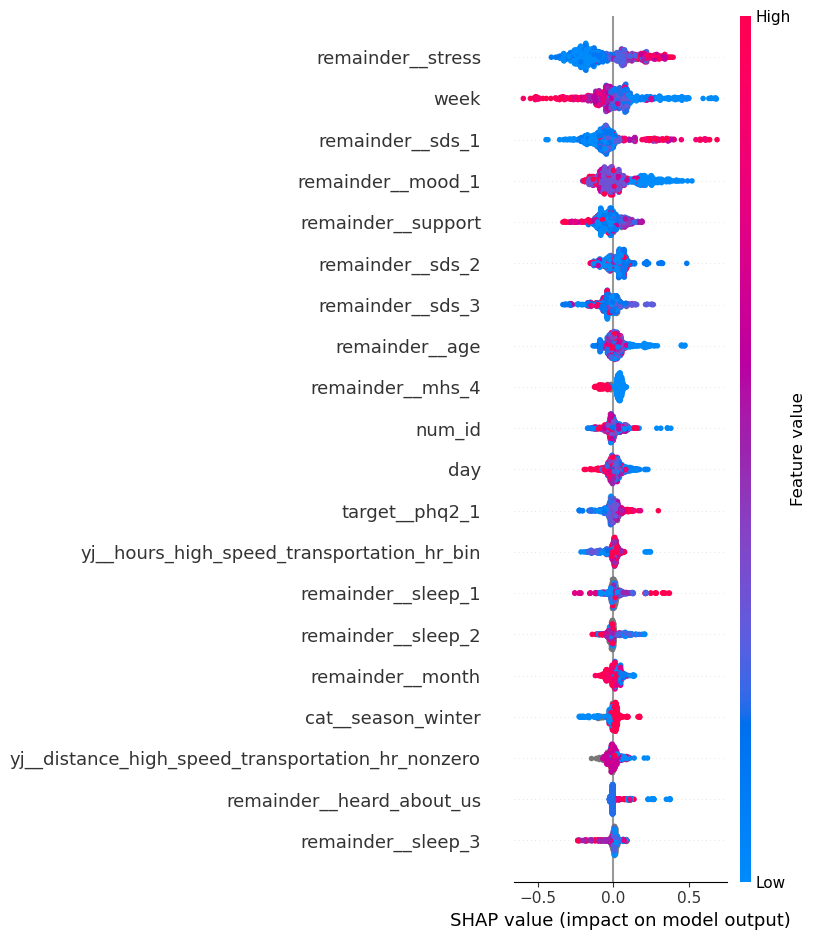

v2_week, CatBoost
cv score: -0.089, mae 0.838, pmc: 0.156
cv score: 0.000, mae 0.786, pmc: 0.240
cv score: -0.051, mae 0.794, pmc: 0.158
R² on test for CatBoost: 0.029, PMC: 0.256


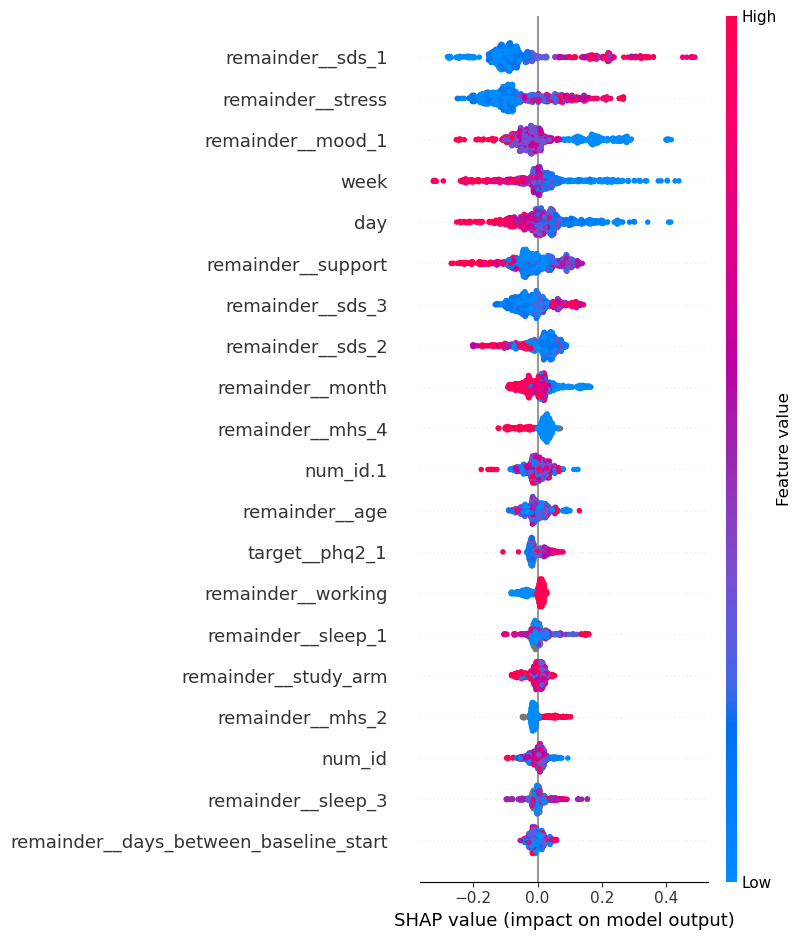

<Figure size 640x480 with 0 Axes>

In [15]:
## R2 and MAE for Non-imputed data

wNA_cv_results = {}
wNA_test_results = {}

for name in df_names:
    wNA_cv_results[name] = {}
    wNA_test_results[name] = {}
    train = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
    train = train.select_dtypes(include=('int64','float64'))
    train = train.dropna(subset=y_col).drop(columns=[col for col in train.columns if col in ['cat__race_1.0', 'cat__race_7.0', 'yj__hours_high_speed_transportation_hr_nonzero']])
    y_train = train[y_col].squeeze()
    X_train = train.drop(columns=[y_col]+[col for col in train.columns if 'phq9' in col or 'indicator' in col or '_nan' in col or 'Unnamed' in col])
    print(f'Training shapes: y {y_train.shape}, X {X_train.shape}')

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    print(f'Training shapes: y {y_train.shape}, X {X_train.shape}')
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs_someNA:
        print(f'{name}, {reg_name}')
        wNA_cv_results[name][reg_name] = {}
        wNA_test_results[name][reg_name] = {}

        wNA_cv_results[name][reg_name]['r2'] = []
        wNA_cv_results[name][reg_name]['mae'] = []
        wNA_test_results[name][reg_name]['r2'] = []
        wNA_test_results[name][reg_name]['mae'] = []
        wNA_cv_results[name][reg_name]['pmc'] = []
        wNA_test_results[name][reg_name]['pmc'] = []

        # 5 fold cross validation
        gkf = GroupKFold(n_splits=3)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train, y_train, groups=groups):
            X_tr, X_cv_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            try: 
                reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
                # Predict on CV
                y_cv_val_pred = reg.predict(X_cv_val)
                # Evaluate r2 CV score
                cv_score = r2_score(y_cv_val, y_cv_val_pred)
                cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
                print(f'cv score: {cv_score:.3f}, mae {cv_mae:.3f}, pmc: {cv_pmc[0]:.3f}')
                wNA_cv_results[name][reg_name]['r2'].append(cv_score)
                wNA_cv_results[name][reg_name]['mae'].append(cv_mae)
                wNA_cv_results[name][reg_name]['pmc'].append(cv_pmc[0])
            except Exception as e: 
                print(f"ERROR: {e}")
        
        # For that reg, predict test
        test = pd.read_csv(os.path.join(brighten_dir, f'{name}_test_transformed.csv'))
        test = test.select_dtypes(include=('int64','float64'))
        test = test.dropna(subset=y_col)
        y_test = test[y_col].squeeze()
        X_test = test.drop(columns=[y_col]+[col for col in test.columns if 'phq9' in col or 'indicator' in col or '_nan' in col or 'Unnamed' in col])
        X_test = X_test[X_train.columns]
        # Fit that reg
        reg.fit(X_train, y_train)
        y_val_pred = reg.predict(X_test)
        # Evaluate r2 test score
        test_score = r2_score(y_test, y_val_pred)
        test_mae = mean_absolute_error(y_test, y_val_pred)
        test_pmc = pearsonr(y_test, y_val_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}, PMC: {test_pmc[0]:.3f}')
        wNA_test_results[name][reg_name]['r2'].append(test_score)
        wNA_test_results[name][reg_name]['mae'].append(test_mae)
        wNA_test_results[name][reg_name]['pmc'].append(test_pmc[0])
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_test)
            shap.summary_plot(shap_values, X_test,show=False)
            plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_non-imputed.png"), bbox_inches="tight", dpi=300)
            plt.show()
            plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots



,Dataset,Regressor,Metric,Score
0,v1_day,Hist Gradient Boost,r2,-0.009384
1,v1_day,Hist Gradient Boost,r2,0.058891
2,v1_day,Hist Gradient Boost,r2,0.072133
3,v1_day,Hist Gradient Boost,mae,0.782331
4,v1_day,Hist Gradient Boost,mae,0.773774
...,...,...,...,...
103,v2_week,CatBoost,mae,0.785875
104,v2_week,CatBoost,mae,0.794050
105,v2_week,CatBoost,pmc,0.156329
106,v2_week,CatBoost,pmc,0.240457


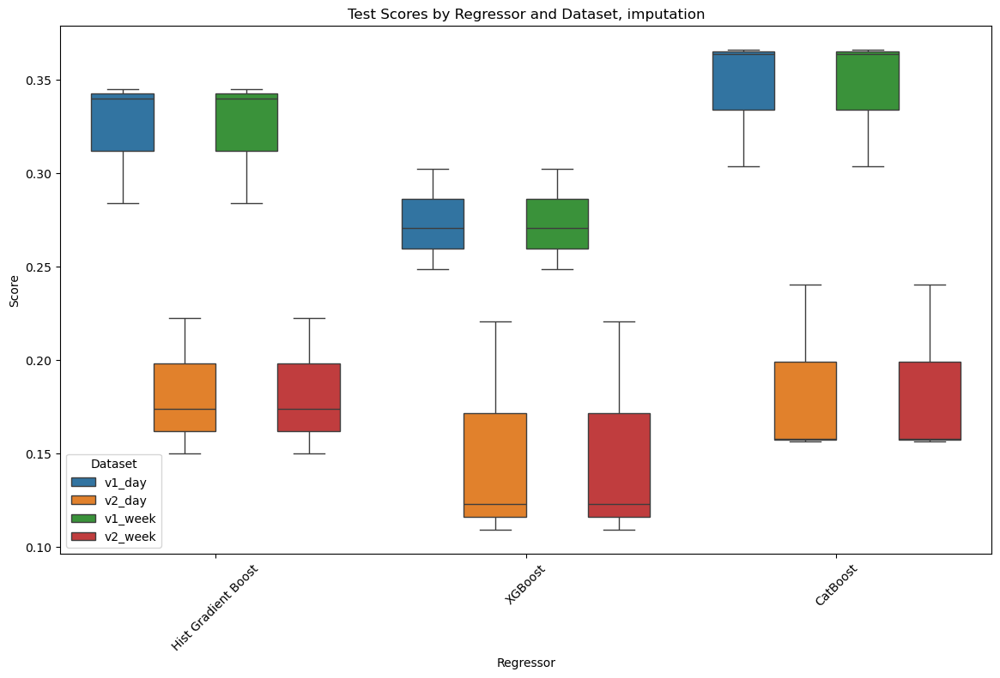

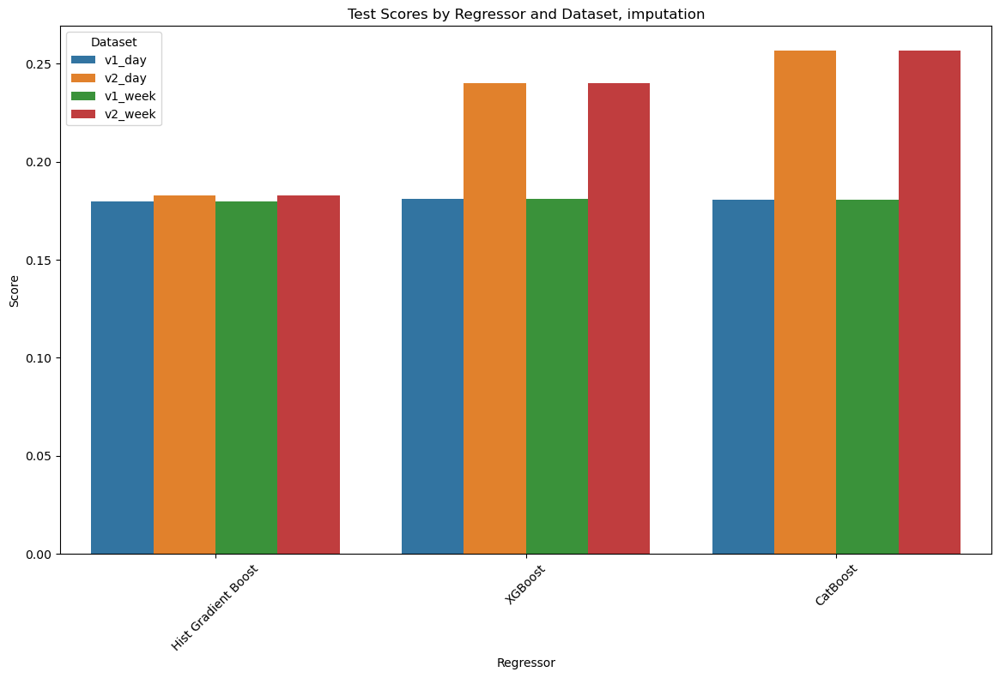

Score
Dataset Regressor           Metric          
v1_day  CatBoost            mae     0.853484
                            pmc     0.180777
                            r2     -0.080267
        Hist Gradient Boost mae     0.857084
                            pmc     0.179795
                            r2     -0.084973
        XGBoost             mae     0.880103
                            pmc     0.180860
                            r2     -0.122715
v1_week CatBoost            mae     0.853484
                            pmc     0.180777
                            r2     -0.080267
        Hist Gradient Boost mae     0.857084
                            pmc     0.179795
                            r2     -0.084973
        XGBoost             mae     0.880103
                            pmc     0.180860
                            r2     -0.122715
v2_day  CatBoost            mae     0.772055
                            pmc     0.256478
                            r2      0.029438
        Hist Gradient Boost mae     0.799420
                            pmc     0.182593
                            r2     -0.040986
        XGBoost             mae     0.807573
                            pmc     0.240137
                            r2     -0.087165
v2_week CatBoost            mae     0.772055
                            pmc     0.256478
                            r2      0.029438
        Hist Gradient Boost mae     0.799420
                            pmc     0.182593
                            r2     -0.040986
        XGBoost             mae     0.807573
                            pmc     0.240137
                            r2     -0.087165

In [20]:

## CV Score Plotting
# Extract test data to flattened df for plotting
wNA_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    wNA_flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
                    
wNA_flat_cv_results_df = pd.DataFrame(wNA_flat_cv_results)
wNA_flat_cv_results_df.to_csv(os.path.join(brighten_dir, 'wNA_flat_cv_results_df.csv'))
display(wNA_flat_cv_results_df)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=wNA_flat_cv_results_df[wNA_flat_cv_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Test Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(cv_dir, 'PMC Pearson R CV Scores by Regressor and Dataset on _train dataset, NO imputation, before tuning.png'))
plt.show()


## TEST Results Plotting

# Extract test data to flattened df for plotting
wNA_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                wNA_flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
wNA_flat_test_results_df = pd.DataFrame(wNA_flat_test_results)


plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=wNA_flat_test_results_df[wNA_flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Test Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(val_dir, 'PMC Pearson R Test Scores by Regressor and Dataset on _val dataset, NO imputation, before tuning.png'))
plt.show()


wNA_flat_test_results_df['Score'] = pd.to_numeric(wNA_flat_test_results_df['Score'])
results_wNA_grouped = wNA_flat_test_results_df.groupby(['Dataset', 'Regressor','Metric']).agg('mean')
display(results_wNA_grouped)
results_wNA_grouped.to_csv(os.path.join(brighten_dir, 'results_wNA_grouped.csv'))





## PCA

v1_day, Decision Tree
cv score: -0.6553138059376882, mae 0.8892772505785699
cv score: -0.5526897091607739, mae 0.818553538466711
cv score: -0.9009310844167269, mae 1.0985642112277
R² on test for Decision Tree: -0.163, PMC: 0.473, MAE: 0.607


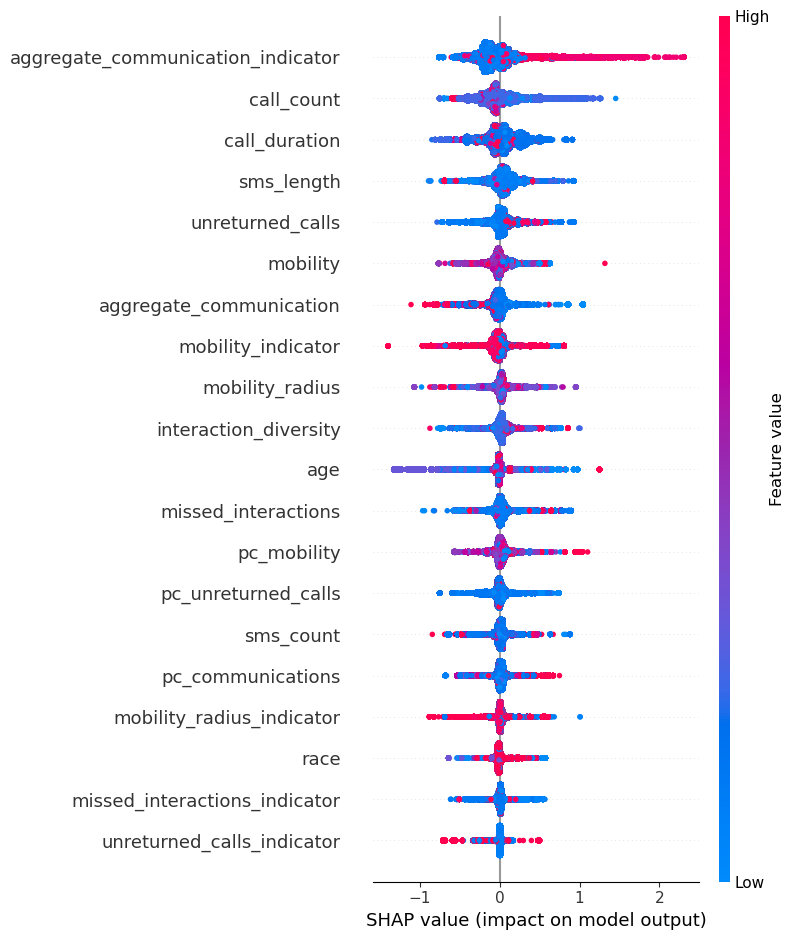

v1_day, Hist Gradient Tree
cv score: 0.006541568048819224, mae 0.7722716039459693
cv score: -0.1339882341925296, mae 0.8439423670390093
cv score: -0.1138566797831535, mae 0.8675971250680072
R² on test for Hist Gradient Tree: 0.209, PMC: 0.474, MAE: 0.640


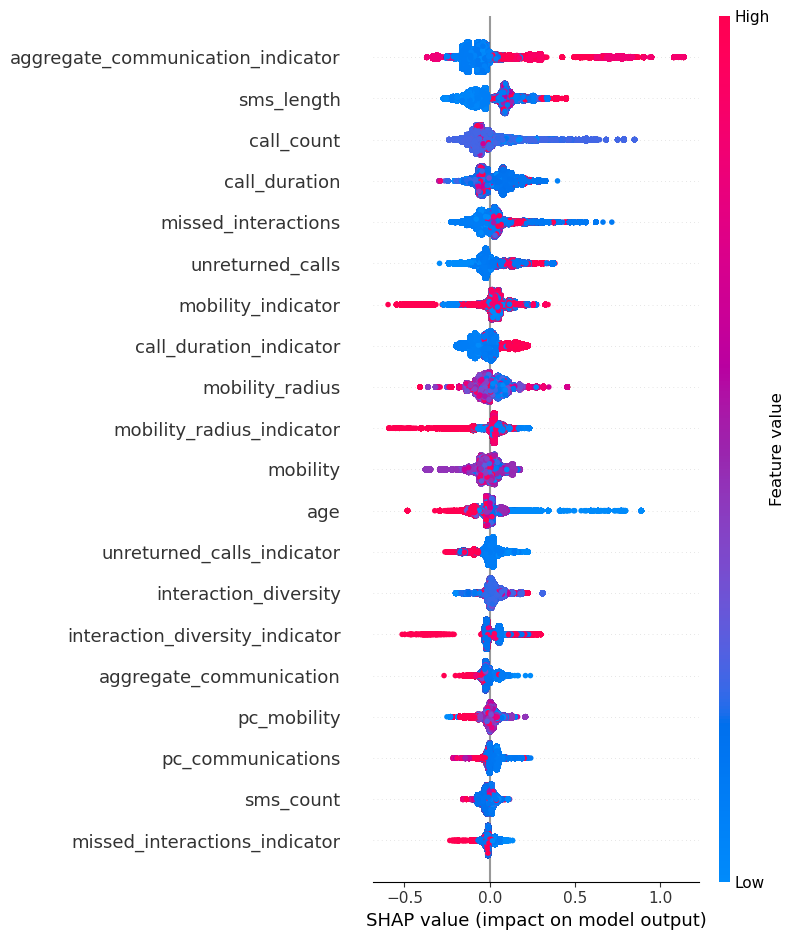

v1_day, XGBoost
cv score: -0.05974965103637908, mae 0.8111068613733746
cv score: -0.28224368213309736, mae 0.8481521655078701
cv score: -0.14242652197178907, mae 0.8864704106563402
R² on test for XGBoost: 0.275, PMC: 0.557, MAE: 0.568


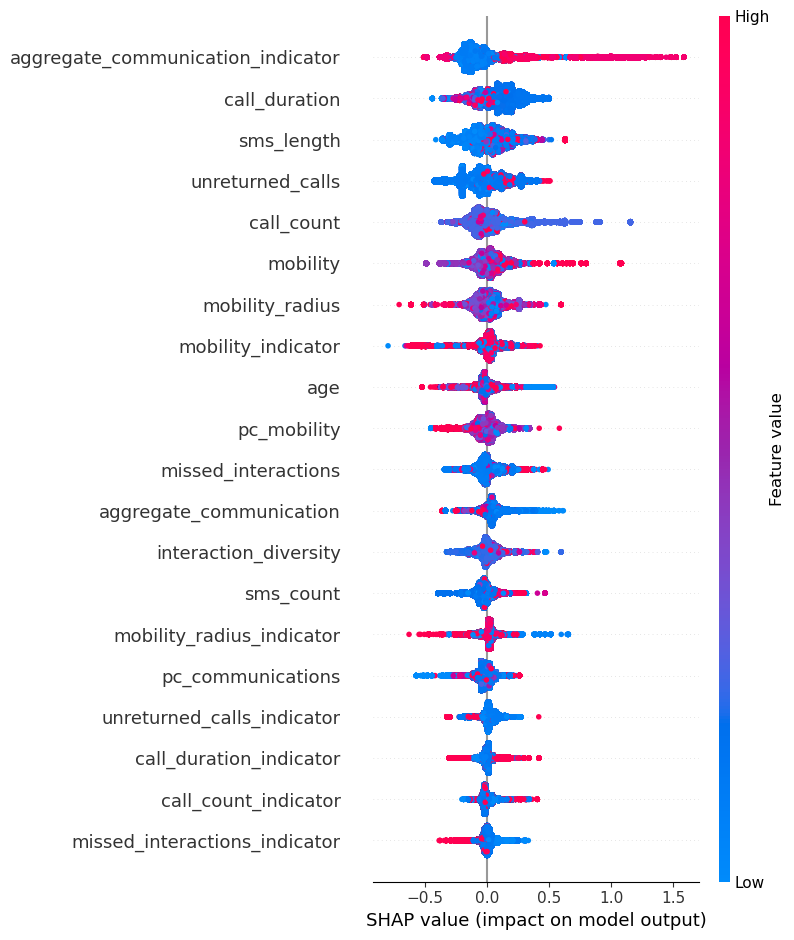

v1_day, AdaBoost
cv score: -0.1201411402200705, mae 0.9068957565800918
cv score: -0.4159604054721493, mae 0.9736226360323679
cv score: -0.1380652912296274, mae 0.9450355115648018
R² on test for AdaBoost: 0.074, PMC: 0.303, MAE: 0.741
v1_day, Gradient Boost
cv score: -0.05332647216188002, mae 0.8094101878596424
cv score: -0.3131946268596857, mae 0.9205638998284259
cv score: -0.09307213901925171, mae 0.8480586588007822
R² on test for Gradient Boost: 0.142, PMC: 0.383, MAE: 0.674


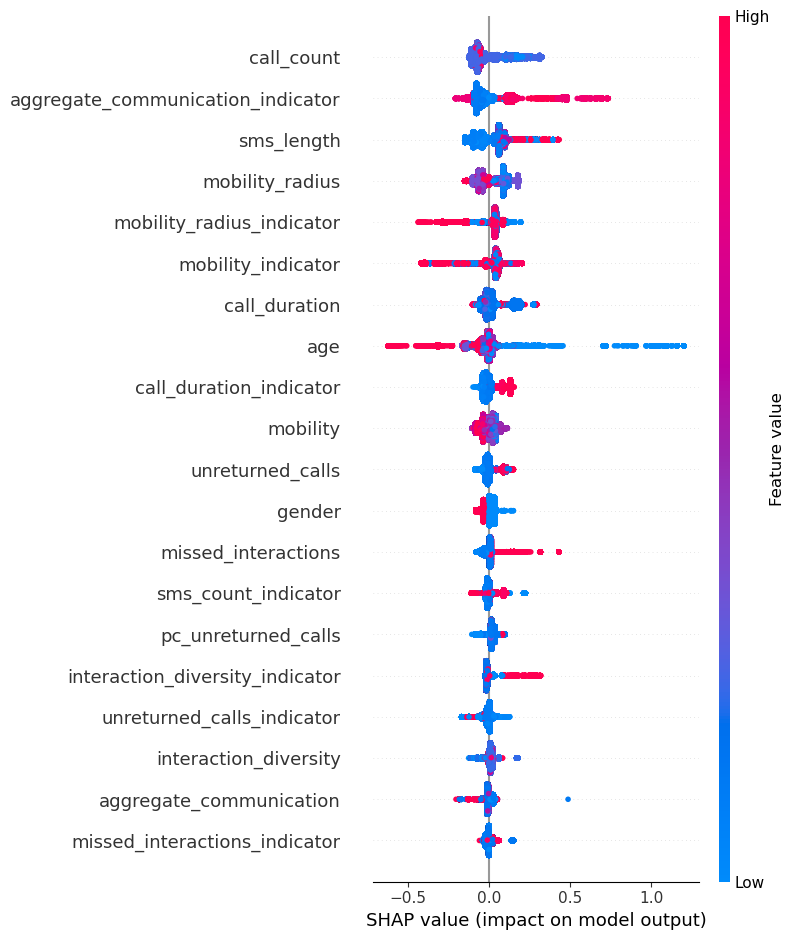

v1_day, Bagging
cv score: -0.0698554772410136, mae 0.7492800493153002
cv score: -0.06335589658101637, mae 0.7337290078108807
cv score: -0.2342957367034455, mae 0.8862665093128218
R² on test for Bagging: 0.283, PMC: 0.598, MAE: 0.500
v1_day, CatBoost
cv score: -0.07954247324899977, mae 0.8125093236104147
cv score: -0.2845706072522194, mae 0.8660169914311825
cv score: -0.06735770022357057, mae 0.8470635842313885
R² on test for CatBoost: 0.358, PMC: 0.604, MAE: 0.544


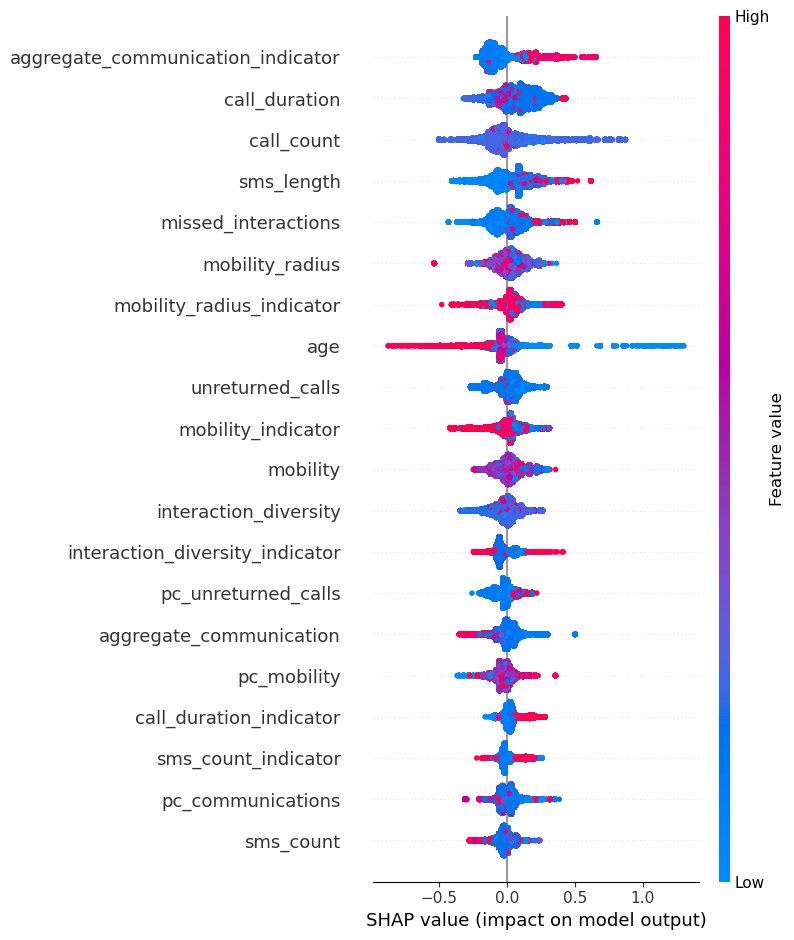

v2_day, Decision Tree
cv score: -2.7562543117583735, mae 1.0228568163889085
cv score: -0.37526265837771033, mae 0.7941640150820389
cv score: -0.7203047379586365, mae 0.7048321034076347
R² on test for Decision Tree: -0.689, PMC: 0.237, MAE: 0.777


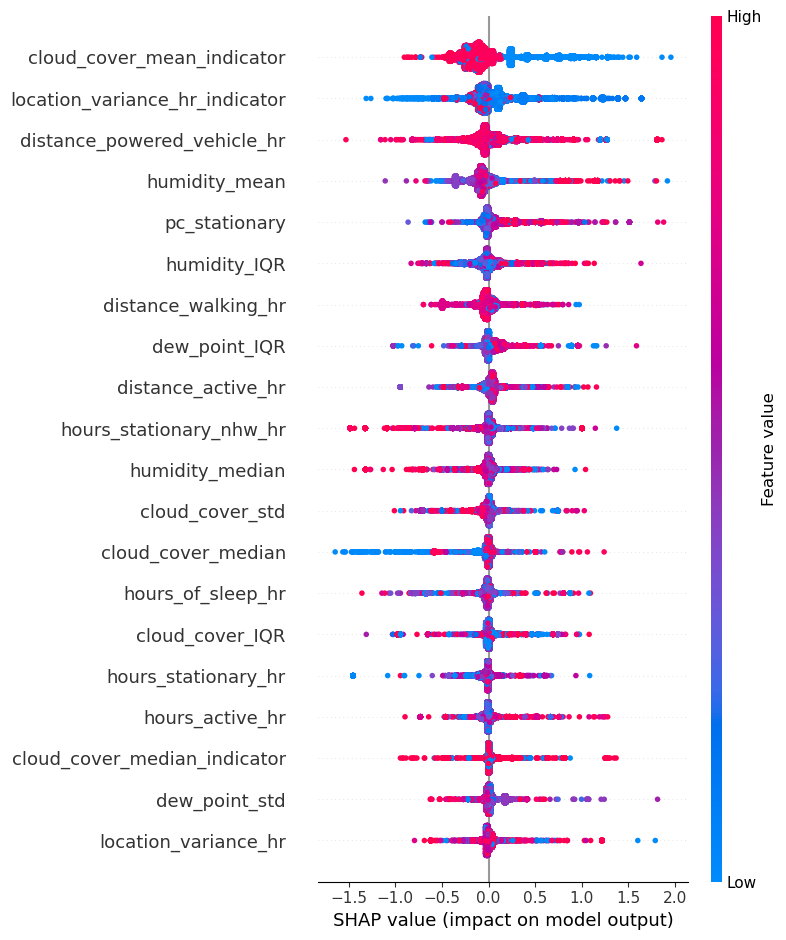

v2_day, Hist Gradient Tree
cv score: 0.006950028174759204, mae 0.6179658440082615
cv score: 0.2595442835941615, mae 0.8802166031402702
cv score: -0.00828053904434789, mae 0.5862904501853445
R² on test for Hist Gradient Tree: 0.077, PMC: 0.357, MAE: 0.637


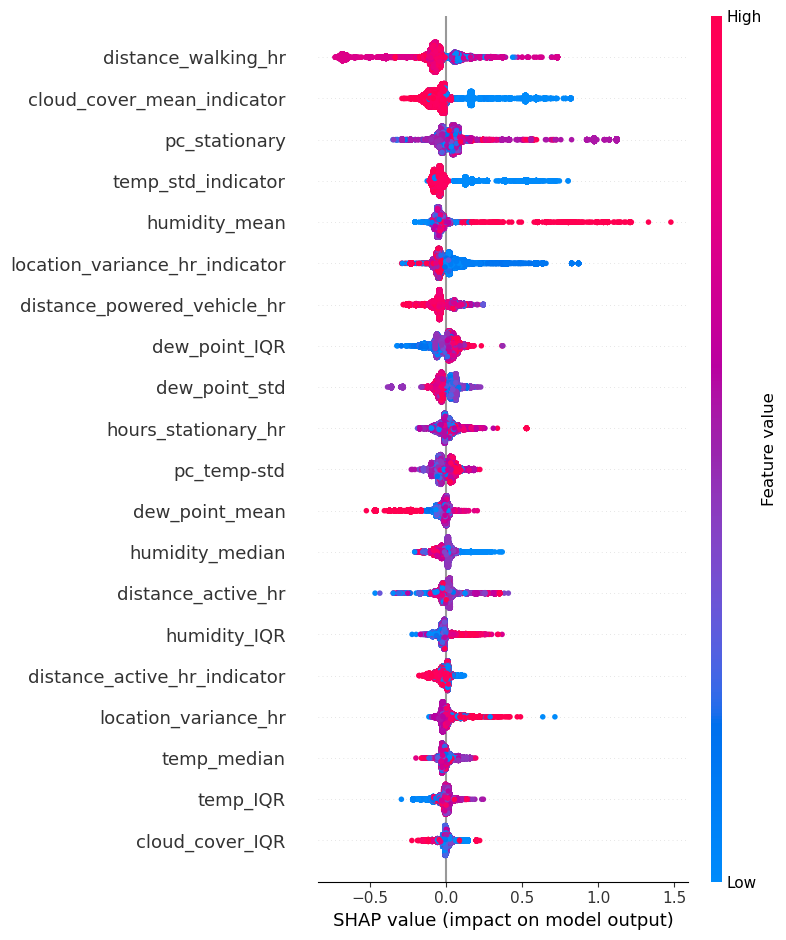

v2_day, XGBoost
cv score: -0.08584621395229908, mae 0.6366439525610447
cv score: 0.408554878841926, mae 0.7004860454728924
cv score: -0.07219537676201515, mae 0.6597404792494492
R² on test for XGBoost: 0.100, PMC: 0.397, MAE: 0.604


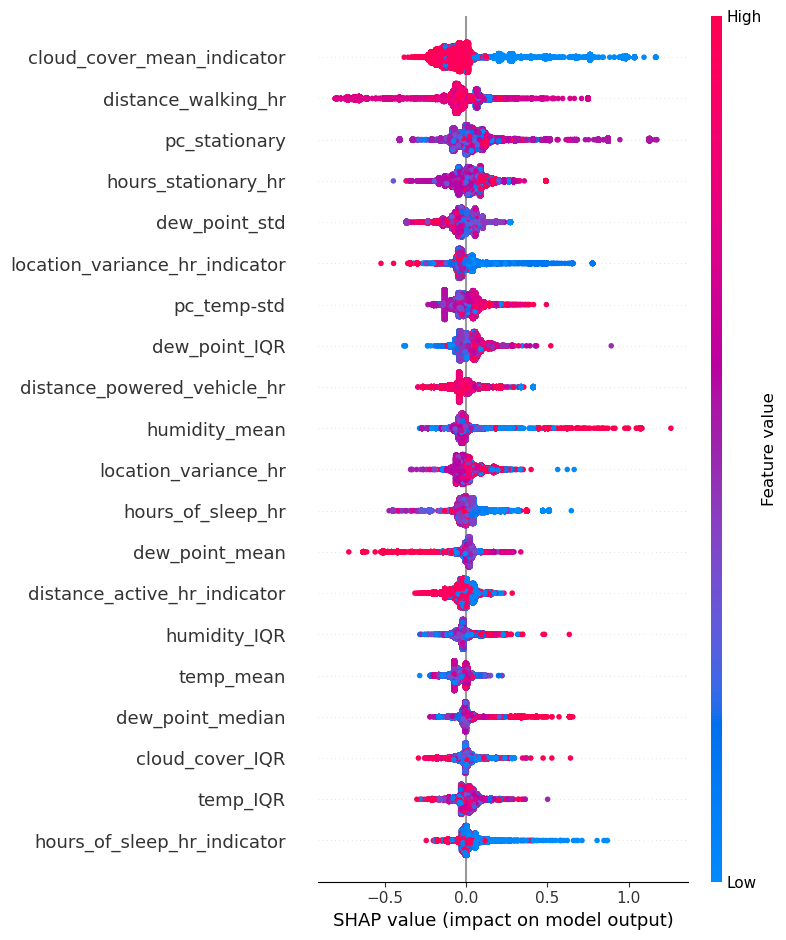

v2_day, AdaBoost
cv score: -0.3890181459148696, mae 0.9921150552924753
cv score: -0.03847275932913852, mae 1.2212003425692723
cv score: -0.5964318784199876, mae 1.0707550228770992
R² on test for AdaBoost: -0.404, PMC: 0.240, MAE: 1.013
v2_day, Gradient Boost
cv score: 0.14475117190496734, mae 0.5481735759587788
cv score: 0.03709976475920418, mae 1.038723692645177
cv score: 0.02111046460418997, mae 0.6442745959644164
R² on test for Gradient Boost: 0.029, PMC: 0.278, MAE: 0.665


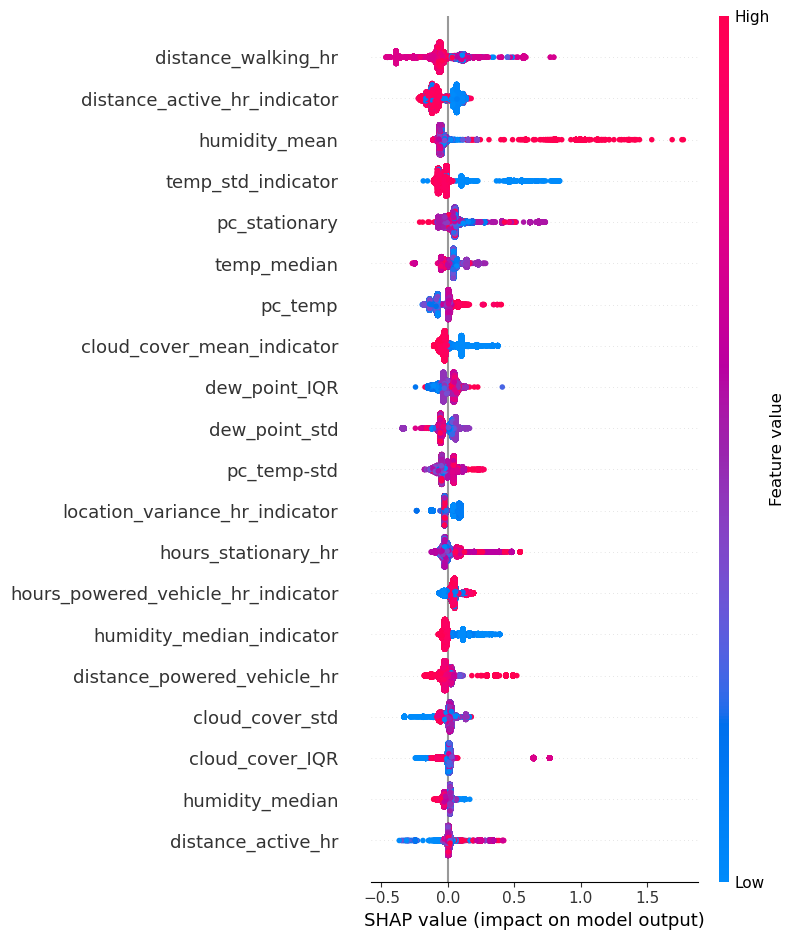

v2_day, Bagging
cv score: -0.2593233766697782, mae 0.6933256842311084
cv score: 0.2430947341393842, mae 0.7486853479854
cv score: -0.20526266434900697, mae 0.6331641001935481
R² on test for Bagging: -0.004, PMC: 0.362, MAE: 0.660
v2_day, CatBoost
cv score: 0.04070084997036927, mae 0.6496652896335585
cv score: 0.33352796459559764, mae 0.7744530407185093
cv score: 0.02223437622060198, mae 0.6213315518497418
R² on test for CatBoost: 0.152, PMC: 0.409, MAE: 0.614


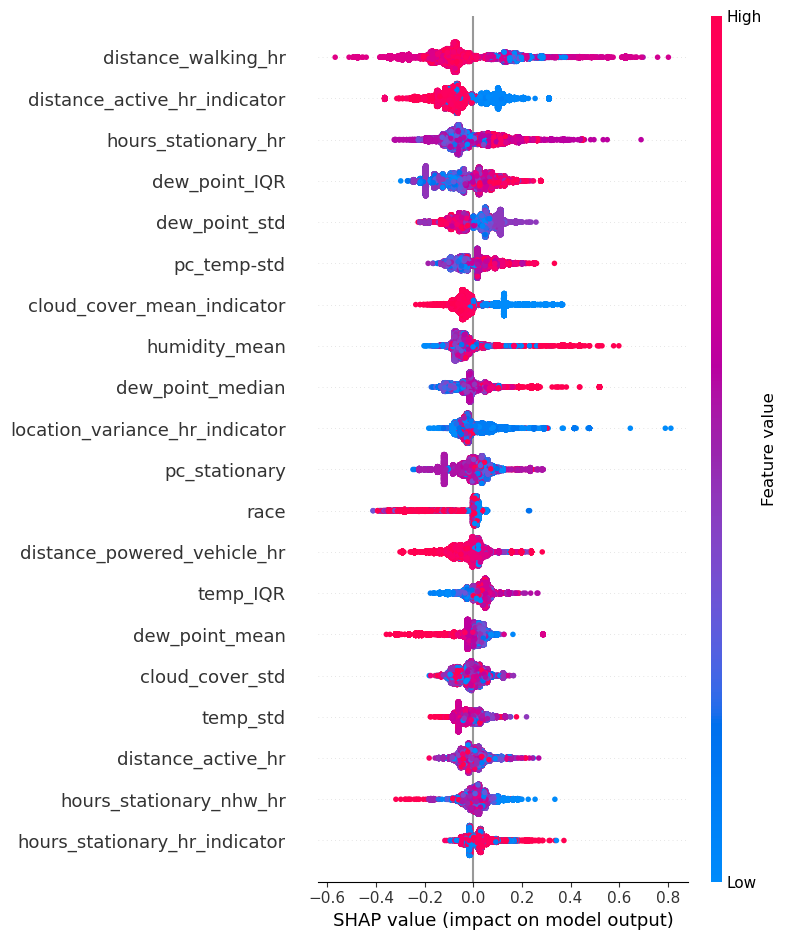

v1_week, Decision Tree
cv score: -0.8278902511805581, mae 1.689321097299396
cv score: -0.27484817567557007, mae 1.3603560595769508
cv score: -1.8291120772543858, mae 1.5638648360798804
R² on test for Decision Tree: -0.421, PMC: 0.488, MAE: 0.677


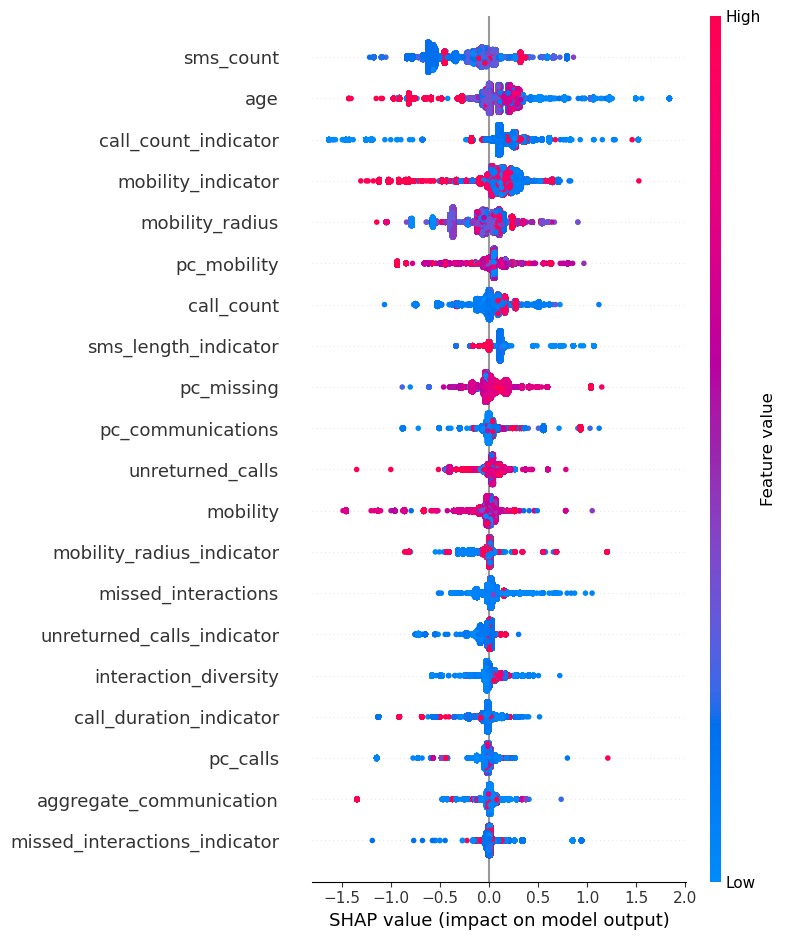

v1_week, Hist Gradient Tree
cv score: -0.23241578432961485, mae 1.4875439402223245
cv score: -0.36931224724196476, mae 1.3334967755085152
cv score: -0.7093335601775905, mae 1.284378962385364
R² on test for Hist Gradient Tree: 0.397, PMC: 0.704, MAE: 0.493


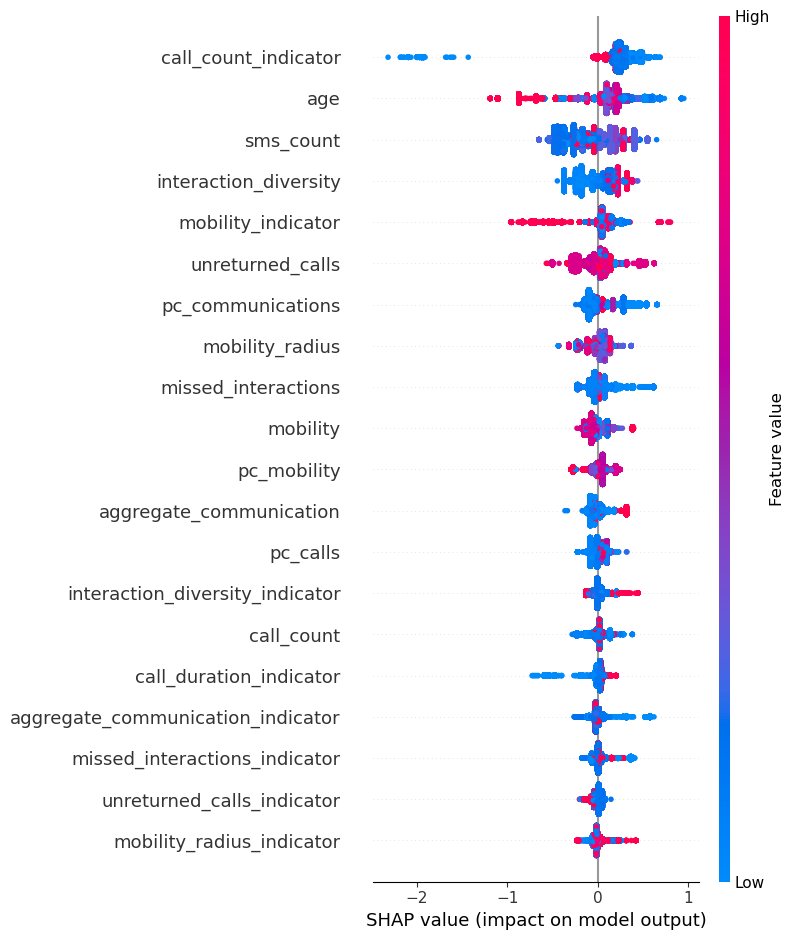

v1_week, XGBoost
cv score: -0.1765813852030873, mae 1.5170621243478983
cv score: -0.3509814731957417, mae 1.425150381014387
cv score: -0.5080337076777539, mae 1.2098019717855133
R² on test for XGBoost: 0.302, PMC: 0.719, MAE: 0.551


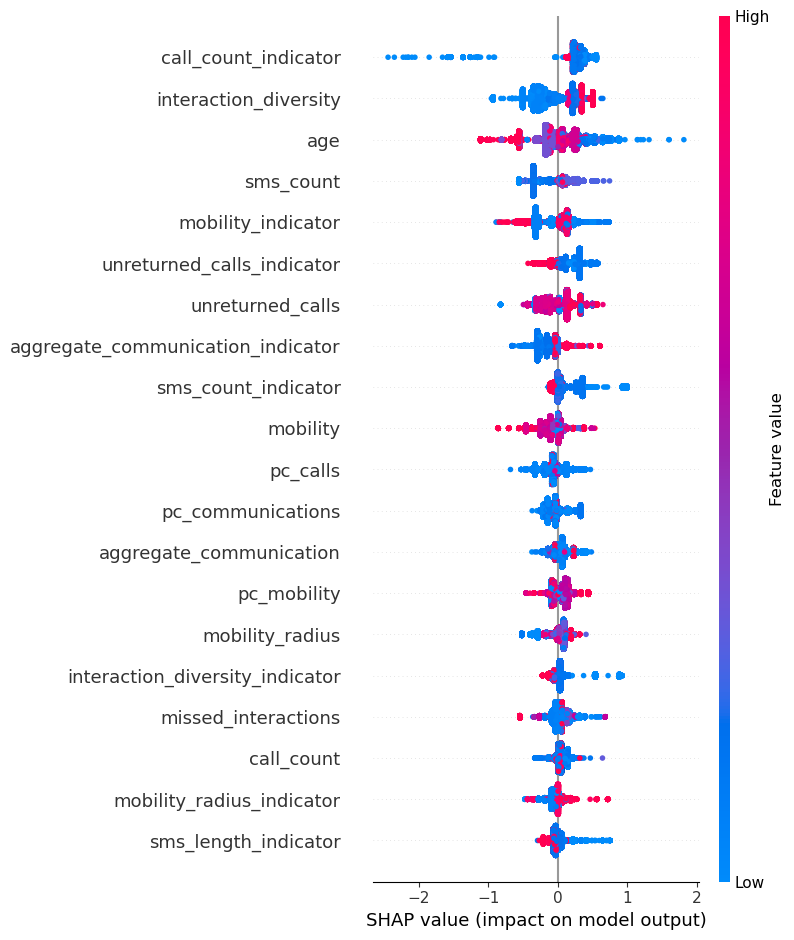

v1_week, AdaBoost
cv score: -0.2188955061665636, mae 1.4830062687461674
cv score: -0.1400400863278355, mae 1.2301386588235197
cv score: -0.8974992540915339, mae 1.373726406260167
R² on test for AdaBoost: 0.113, PMC: 0.381, MAE: 0.743
v1_week, Gradient Boost
cv score: -0.861766642891197, mae 1.8144773255285802
cv score: -0.270794754823217, mae 1.280435474735622
cv score: -0.6262610194433504, mae 1.2200739266259262
R² on test for Gradient Boost: 0.378, PMC: 0.624, MAE: 0.563


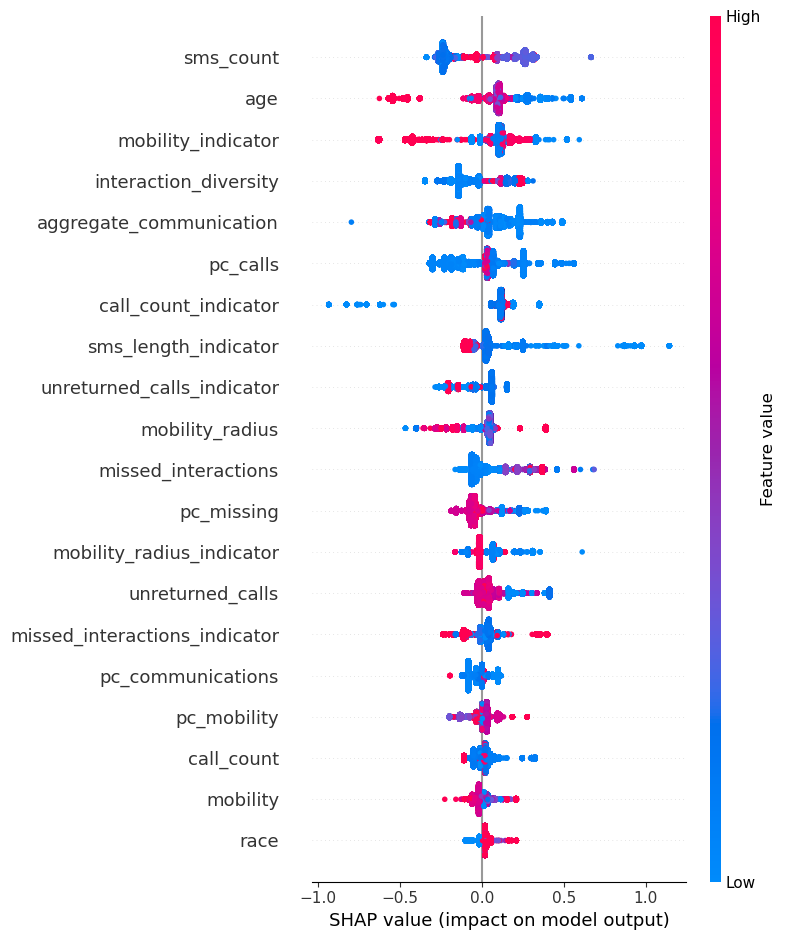

v1_week, Bagging
cv score: -0.36688895870438865, mae 1.6242523935442583
cv score: -0.15837531332900046, mae 1.3153380157466097
cv score: -0.3771206254712818, mae 1.1141641201359342
R² on test for Bagging: 0.179, PMC: 0.568, MAE: 0.494
v1_week, CatBoost
cv score: -0.5911943013894918, mae 1.7960049510690297
cv score: -0.1073584932495748, mae 1.2070657992670815
cv score: -0.864854956292217, mae 1.2972113640919214
R² on test for CatBoost: 0.352, PMC: 0.703, MAE: 0.487


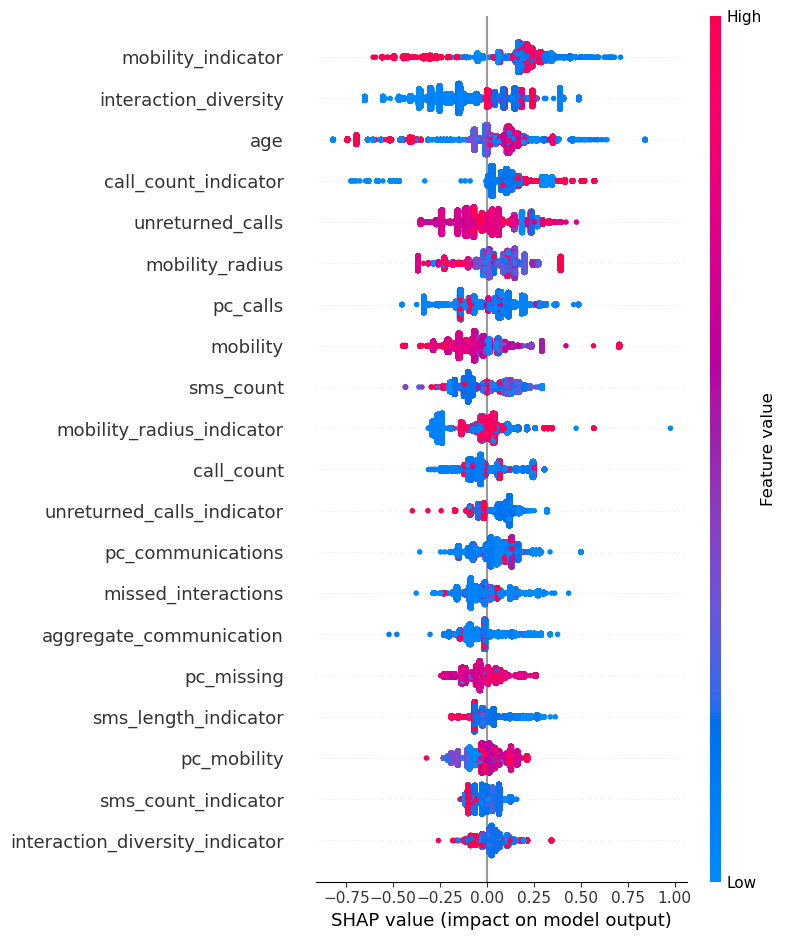

v2_week, Decision Tree
cv score: -3.3923745522715913, mae 2.9152232790037087
cv score: -0.24309902387243953, mae 1.5033189881778097
cv score: -1.7212996387229023, mae 1.8907091369091018
R² on test for Decision Tree: -1.804, PMC: -0.246, MAE: 1.628


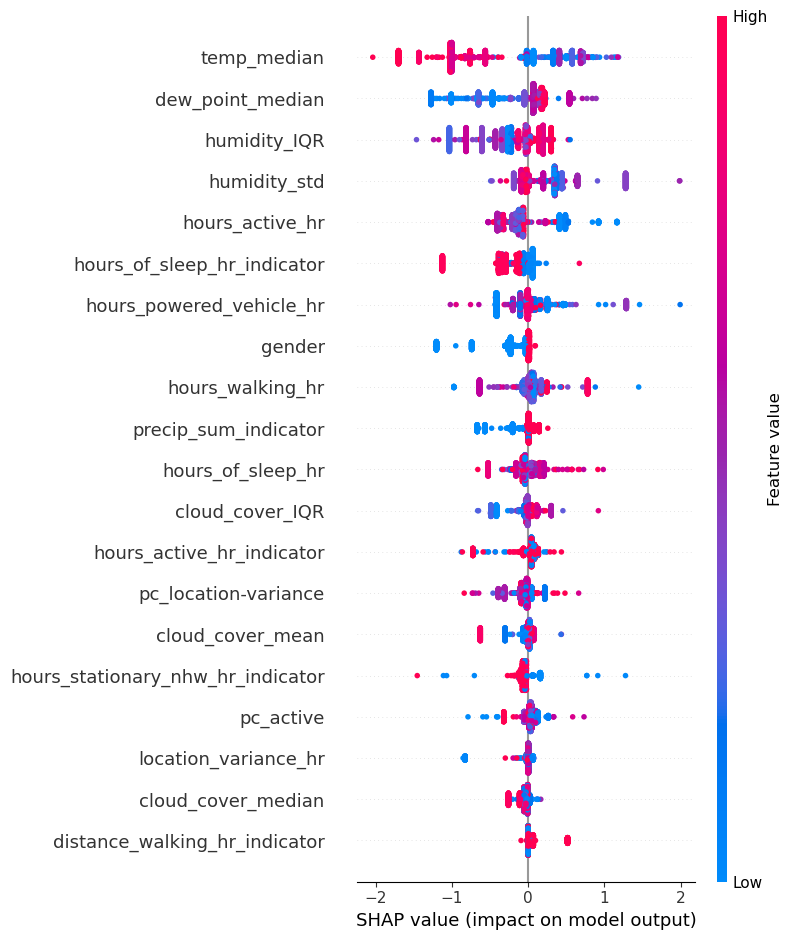

v2_week, Hist Gradient Tree
cv score: -0.03011021022079996, mae 1.3081355283920302
cv score: -0.15490051996962917, mae 1.5294751033050589
cv score: -1.0202741357911482, mae 1.6714460303523573
R² on test for Hist Gradient Tree: 0.605, PMC: 0.831, MAE: 0.696


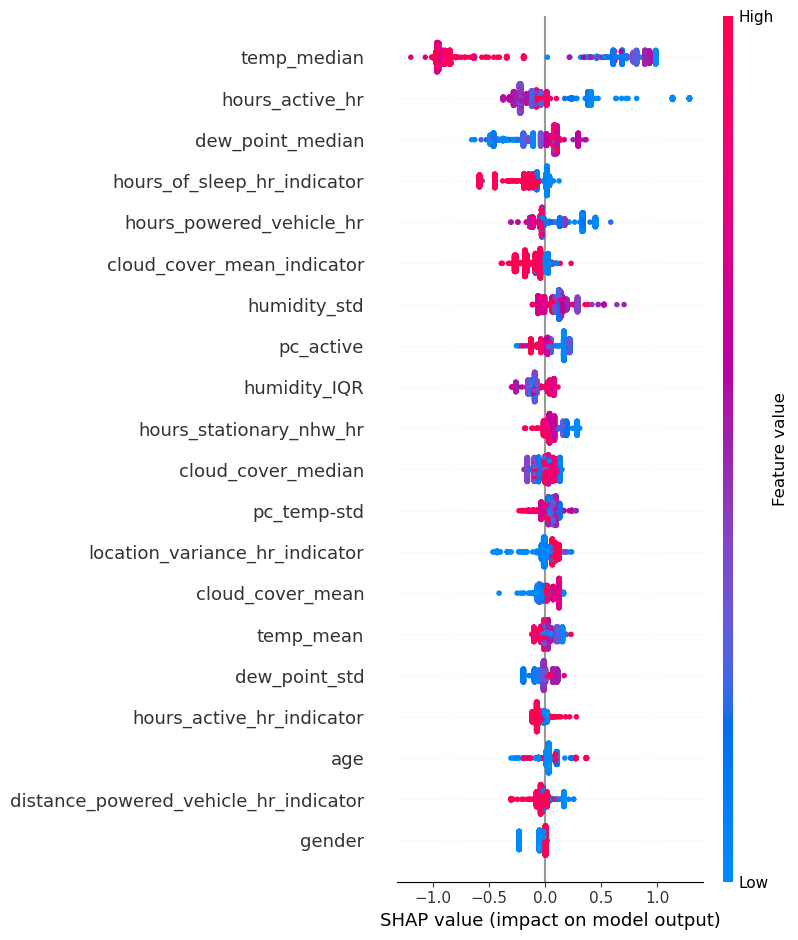

v2_week, XGBoost
cv score: -2.141516269439954, mae 2.249049838165468
cv score: -0.43210088782581146, mae 1.7103039450197677
cv score: -1.1370062580138054, mae 1.753566231434494
R² on test for XGBoost: 0.297, PMC: 0.553, MAE: 0.903


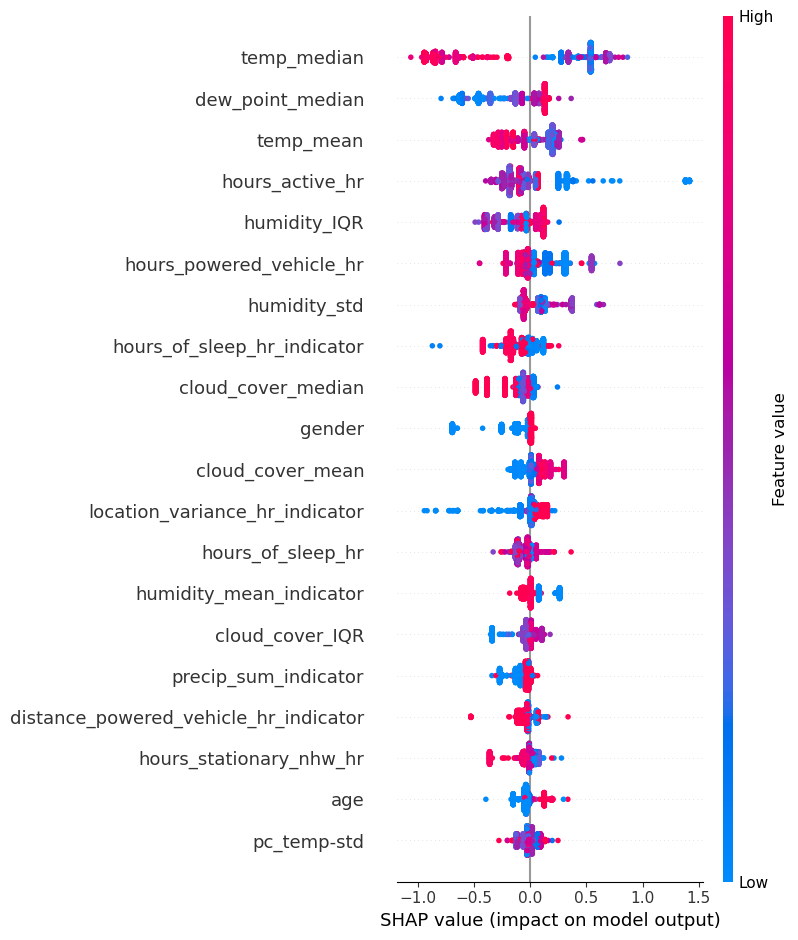

v2_week, AdaBoost
cv score: -0.10531202189378064, mae 1.6705674447091066
cv score: -0.6967542797891053, mae 1.8894206621502734
cv score: -0.22052716810840423, mae 1.3354864631766077
R² on test for AdaBoost: 0.178, PMC: 0.512, MAE: 1.037
v2_week, Gradient Boost
cv score: -0.9150784855805152, mae 2.097641519455369
cv score: -0.6199314946803478, mae 1.8294569955205942
cv score: -0.8197090291488447, mae 1.6550824705501677
R² on test for Gradient Boost: 0.171, PMC: 0.469, MAE: 0.953


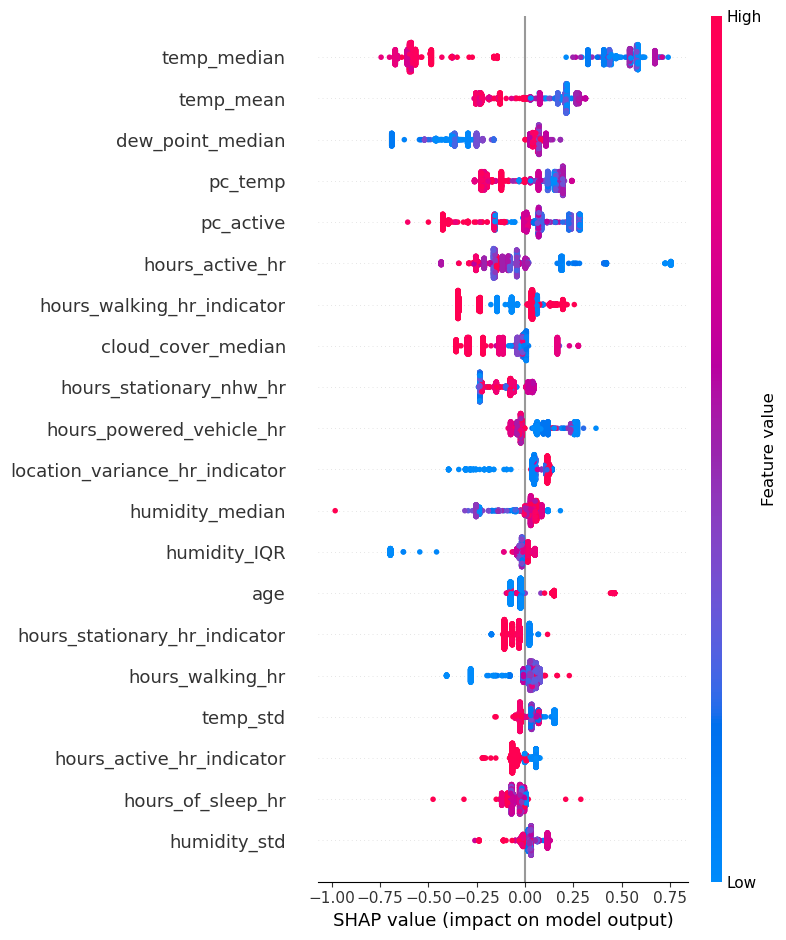

v2_week, Bagging
cv score: -0.44599860522677326, mae 1.7520376185930369
cv score: -0.10404598903150641, mae 1.5102573299331359
cv score: -0.7322390552425195, mae 1.6480630588499625
R² on test for Bagging: 0.419, PMC: 0.667, MAE: 0.719
v2_week, CatBoost
cv score: -1.217542500758245, mae 2.070065250626971
cv score: -0.25032259538397295, mae 1.6474682677016015
cv score: -1.0278310929089822, mae 1.747981193899902
R² on test for CatBoost: 0.487, PMC: 0.706, MAE: 0.750


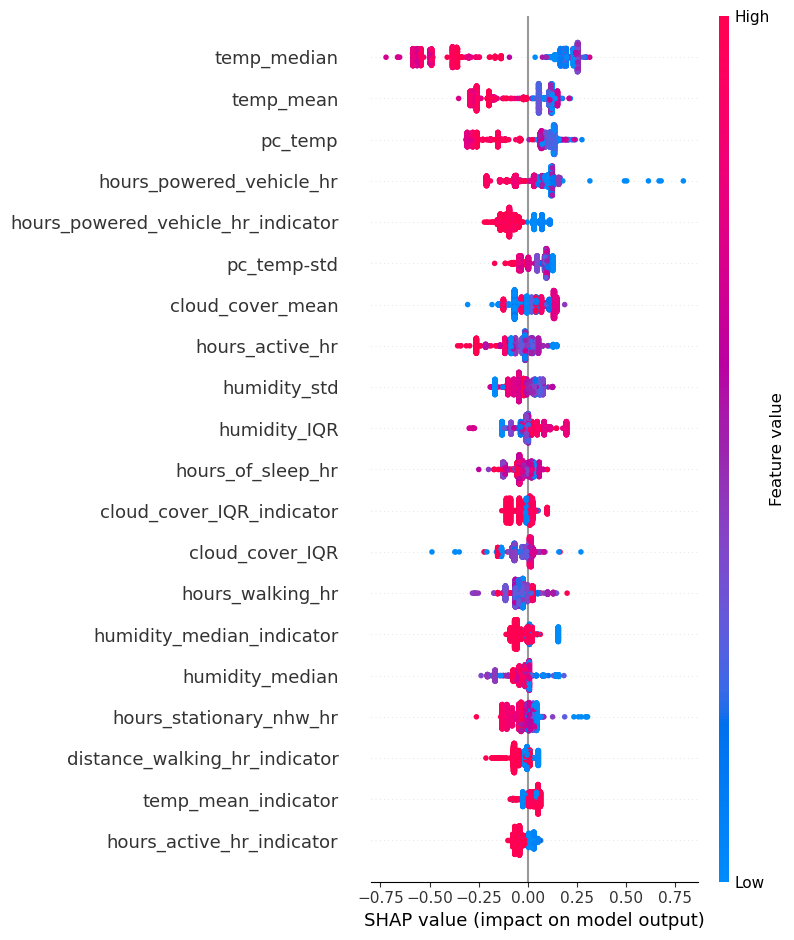

<Figure size 640x480 with 0 Axes>

In [11]:
## PCA 
from sklearn.model_selection import GroupKFold, cross_val_score
id_columns.append('idx')
pca_cv_results = {}
pca_test_results = {}

for name in df_names:
    pca_cv_results[name] = {}
    pca_test_results[name] = {}

    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_train.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_train.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    # Evaluate each classifier using cross-validation

    gkf = GroupKFold(n_splits=5)

    for reg_name, reg in regs:
        if 'Random Forest' not in reg_name:
            print(f'{name}, {reg_name}')
            pca_cv_results[name][reg_name] = {}
            pca_test_results[name][reg_name] = {}

            pca_cv_results[name][reg_name]['r2'] = []
            pca_cv_results[name][reg_name]['mae'] = []
            pca_cv_results[name][reg_name]['pmc'] = []

            pca_test_results[name][reg_name]['r2'] = []
            pca_test_results[name][reg_name]['mae'] = []
            pca_test_results[name][reg_name]['pmc'] = []

            # 5 fold cross validation
            gkf = GroupKFold(n_splits=3)
            # going through each CV split
            for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
                X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
                y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
                try: 
                    reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
                    # Predict on CV
                    y_cv_val_pred = reg.predict(X_cv_val)
                    # Evaluate r2 CV score
                    cv_score = r2_score(y_cv_val, y_cv_val_pred)
                    cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                    cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
                    print(f'cv score: {cv_score}, mae {cv_mae}')
                    pca_cv_results[name][reg_name]['r2'].append(cv_score)
                    pca_cv_results[name][reg_name]['mae'].append(cv_mae)
                    pca_cv_results[name][reg_name]['pmc'].append(cv_pmc[0])
                except Exception as e: 
                    print(f"ERROR: {e}")
            
            # For that reg, predict test
            X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_val.csv'))
            X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col])
            y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_val.csv'))
            y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
            # Fit that reg
            reg.fit(X_train_cleaned, y_train_cleaned)
            y_val_pred = reg.predict(X_val_cleaned)
            # Evaluate r2 test score
            test_score = r2_score(y_val_cleaned, y_val_pred)
            test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
            test_pmc = pearsonr(y_val_cleaned, y_val_pred)
            print(f'R² on test for {reg_name}: {test_score:.3f}, PMC: {test_pmc[0]:.3f}, MAE: {test_mae:.3f}')
            pca_test_results[name][reg_name]['r2'].append(test_score)
            pca_test_results[name][reg_name]['mae'].append(test_mae)
            pca_test_results[name][reg_name]['pmc'].append(test_pmc[0])
            if 'Ada' not in reg_name and "agging" not in reg_name:
                explainer = shap.Explainer(reg)
                shap_values = explainer.shap_values(X_val_cleaned)
                shap.summary_plot(shap_values, X_val_cleaned, show=False)
                plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_pca.png"), bbox_inches="tight", dpi=300)
                plt.show()
                plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots

        


,v1_day,v2_day,v1_week,v2_week
Decision Tree,"{'r2': [-0.6553138059376882, -0.55268970916077...","{'r2': [-2.7562543117583735, -0.37526265837771...","{'r2': [-0.8278902511805581, -0.27484817567557...","{'r2': [-3.3923745522715913, -0.24309902387243..."
Hist Gradient Tree,"{'r2': [0.006541568048819224, -0.1339882341925...","{'r2': [0.006950028174759204, 0.25954428359416...","{'r2': [-0.23241578432961485, -0.3693122472419...","{'r2': [-0.03011021022079996, -0.1549005199696..."
XGBoost,"{'r2': [-0.05974965103637908, -0.2822436821330...","{'r2': [-0.08584621395229908, 0.40855487884192...","{'r2': [-0.1765813852030873, -0.35098147319574...","{'r2': [-2.141516269439954, -0.432100887825811..."
AdaBoost,"{'r2': [-0.1201411402200705, -0.41596040547214...","{'r2': [-0.3890181459148696, -0.03847275932913...","{'r2': [-0.2188955061665636, -0.14004008632783...","{'r2': [-0.10531202189378064, -0.6967542797891..."
Gradient Boost,"{'r2': [-0.05332647216188002, -0.3131946268596...","{'r2': [0.14475117190496734, 0.037099764759204...","{'r2': [-0.861766642891197, -0.270794754823217...","{'r2': [-0.9150784855805152, -0.61993149468034..."
Bagging,"{'r2': [-0.0698554772410136, -0.06335589658101...","{'r2': [-0.2593233766697782, 0.243094734139384...","{'r2': [-0.36688895870438865, -0.1583753133290...","{'r2': [-0.44599860522677326, -0.1040459890315..."
CatBoost,"{'r2': [-0.07954247324899977, -0.2845706072522...","{'r2': [0.04070084997036927, 0.333527964595597...","{'r2': [-0.5911943013894918, -0.10735849324957...","{'r2': [-1.217542500758245, -0.250322595383972..."


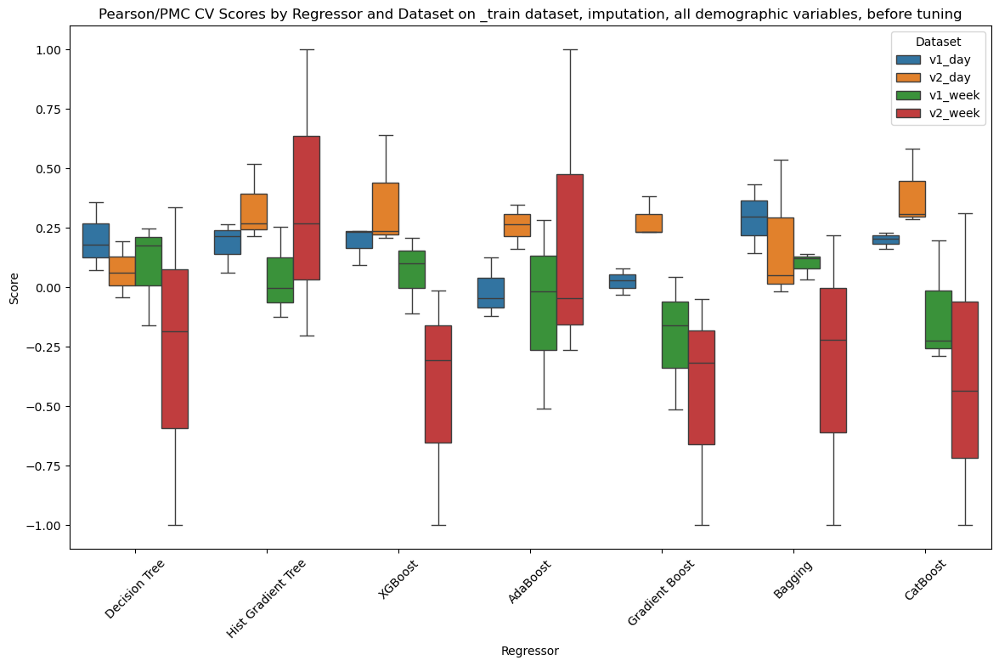

,v1_day,v2_day,v1_week,v2_week
Decision Tree,"{'r2': [-0.16336164030727196], 'mae': [0.60739...","{'r2': [-0.6893995507995587], 'mae': [0.777451...","{'r2': [-0.42086071745625975], 'mae': [0.67735...","{'r2': [-1.8039858853038018], 'mae': [1.628210..."
Hist Gradient Tree,"{'r2': [0.20882776050363894], 'mae': [0.639641...","{'r2': [0.07691954048902994], 'mae': [0.637436...","{'r2': [0.39695244159526877], 'mae': [0.492503...","{'r2': [0.6048769995294717], 'mae': [0.6955131..."
XGBoost,"{'r2': [0.2746922874893639], 'mae': [0.5682524...","{'r2': [0.09985530367763185], 'mae': [0.604417...","{'r2': [0.3022750615542884], 'mae': [0.5506492...","{'r2': [0.2966980781318409], 'mae': [0.9033810..."
AdaBoost,"{'r2': [0.07428324173151613], 'mae': [0.740787...","{'r2': [-0.40387264516148], 'mae': [1.01269230...","{'r2': [0.11292891251017634], 'mae': [0.743442...","{'r2': [0.1782992390379412], 'mae': [1.0369642..."
Gradient Boost,"{'r2': [0.14236286773369167], 'mae': [0.673850...","{'r2': [0.029032047036265607], 'mae': [0.66499...","{'r2': [0.3776586170867665], 'mae': [0.5631973...","{'r2': [0.17124977364117588], 'mae': [0.952554..."
Bagging,"{'r2': [0.28268046040965744], 'mae': [0.499846...","{'r2': [-0.003664134589675294], 'mae': [0.6596...","{'r2': [0.1789627236601613], 'mae': [0.4939869...","{'r2': [0.4190224448446698], 'mae': [0.7191663..."
CatBoost,"{'r2': [0.358334435761399], 'mae': [0.54399252...","{'r2': [0.15229242745992555], 'mae': [0.613592...","{'r2': [0.35205348128841585], 'mae': [0.486654...","{'r2': [0.48741321000302207], 'mae': [0.750467..."


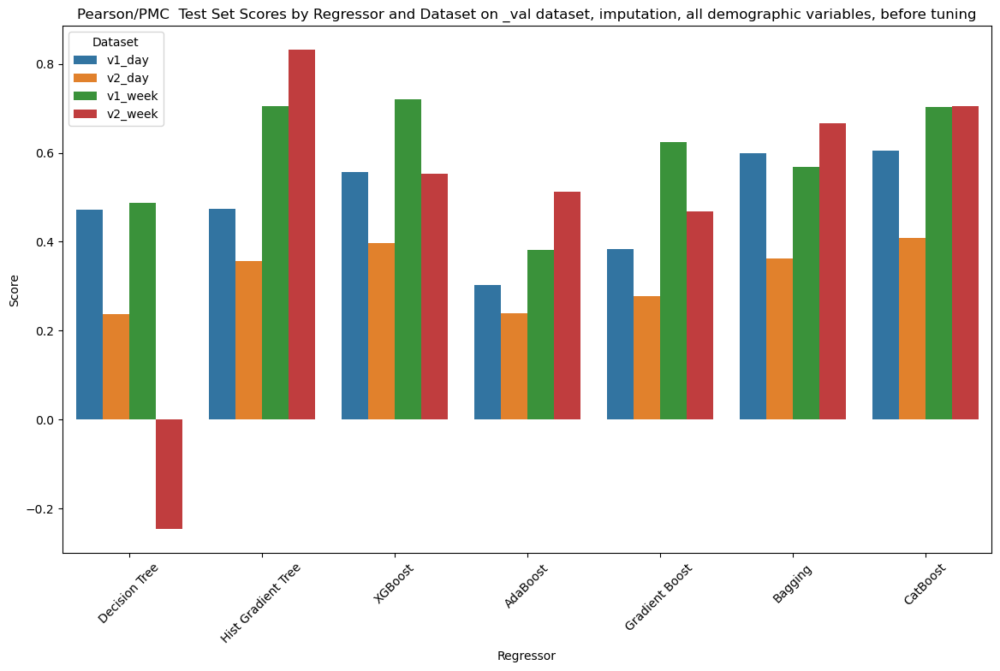

In [12]:

## CV Score Plotting

pca_cv_results_df = pd.DataFrame(pca_cv_results)
pca_cv_results_df.to_csv(os.path.join(brighten_dir, 'pca_cv_results_df.csv'))
display(pca_cv_results_df)


# Extract test data to flattened df for plotting
pca_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in pca_cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    pca_flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
                    
pca_flat_cv_results_df = pd.DataFrame(pca_flat_cv_results)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=pca_flat_cv_results_df[pca_flat_cv_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Pearson/PMC CV Scores by Regressor and Dataset on _train dataset, imputation, all demographic variables, before tuning')
plt.savefig(os.path.join(cv_dir, 'Pearson PMC CV Scores by Regressor and Dataset on _train dataset, imputation, all demographic variables, before tuning.png'))
plt.show()




## TEST Results Plotting
pca_test_results_df = pd.DataFrame(pca_test_results)
pca_test_results_df.to_csv(os.path.join(brighten_dir, 'pca_test_results_df.csv'))
display(pca_test_results_df)


# Extract test data to flattened df for plotting
pca_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in pca_test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                pca_flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
pca_flat_test_results_df = pd.DataFrame(pca_flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=pca_flat_test_results_df[pca_flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Pearson/PMC  Test Set Scores by Regressor and Dataset on _val dataset, imputation, all demographic variables, before tuning')
plt.savefig(os.path.join(val_dir, 'Pearson PMC Test Set Scores by Regressor and Dataset on _val dataset, imputation, all demographic variables, before tuning.png'))
plt.show()



## PCA as function


In [ ]:
import time
def run_pca_modeling(df_names, regs, brighten_dir, shap_dir, id_columns, n_splits=3):
    id_columns = id_columns + ['idx']
    pca_cv_results = {}
    pca_test_results = {}
    time.sleep(6000)

    for name in df_names:
        pca_cv_results[name] = {}
        pca_test_results[name] = {}

        # Load training data
        X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_train.csv'))
        y_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_train.csv'))
        groups = X_train['num_id']

        # Clean columns
        X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
        y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze()

        gkf = GroupKFold(n_splits=n_splits)

        for reg_name, reg in regs:
            if 'Decision' in reg_name:
                continue

            print(f'{name}, {reg_name}')
            pca_cv_results[name][reg_name] = {'r2': [], 'mae': [], 'pmc': []}
            pca_test_results[name][reg_name] = {'r2': [], 'mae': [], 'pmc': []}

            for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
                X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
                y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]

                try:
                    reg.fit(X_tr, y_tr)
                    y_cv_val_pred = reg.predict(X_cv_val)

                    cv_r2 = r2_score(y_cv_val, y_cv_val_pred)
                    cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                    cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)[0]

                    print(f'CV score: {cv_r2:.3f}, MAE: {cv_mae:.3f}')

                    pca_cv_results[name][reg_name]['r2'].append(cv_r2)
                    pca_cv_results[name][reg_name]['mae'].append(cv_mae)
                    pca_cv_results[name][reg_name]['pmc'].append(cv_pmc)
                except Exception as e:
                    print(f"ERROR: {e}")

            # Load and clean test data
            X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_val.csv'))
            y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_val.csv'))

            X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col])
            y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze()

            reg.fit(X_train_cleaned, y_train_cleaned)
            y_val_pred = reg.predict(X_val_cleaned)

            test_r2 = r2_score(y_val_cleaned, y_val_pred)
            test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
            test_pmc = pearsonr(y_val_cleaned, y_val_pred)[0]

            print(f'Test R²: {test_r2:.3f}, PMC: {test_pmc:.3f}, MAE: {test_mae:.3f}')

            pca_test_results[name][reg_name]['r2'].append(test_r2)
            pca_test_results[name][reg_name]['mae'].append(test_mae)
            pca_test_results[name][reg_name]['pmc'].append(test_pmc)

            if 'Ada' not in reg_name and "agging" not in reg_name:
                try:
                    explainer = shap.Explainer(reg)
                    shap_values = explainer.shap_values(X_val_cleaned)
                    shap.summary_plot(shap_values, X_val_cleaned, show=False)
                    plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_pca.png"), bbox_inches="tight", dpi=300)
                    plt.show()
                    plt.clf()
                except Exception as e:
                    print(f"SHAP error: {e}")

    return pca_cv_results, pca_test_results


In [ ]:
from joblib import Parallel, delayed
from concurrent.futures import ThreadPoolExecutor, TimeoutError
import time

# Assume this is your function
def run_pca_modeling_wrapper():
    return run_pca_modeling(df_names, regs, brighten_dir, shap_dir, id_columns)

# Use ThreadPoolExecutor for timeout control
with ThreadPoolExecutor(max_workers=1) as executor:
    future = executor.submit(run_pca_modeling_wrapper)

    try:
        # Wait for at most 6000 seconds (100 minutes)
        result = future.result(timeout=6000)
        cv_results, test_results = result
    except TimeoutError:
        print("Timeout reached — job killed")
        cv_results, test_results = None, None
    except Exception as e:
        print(f"Unhandled exception: {e}")
        cv_results, test_results = None, None


## From this we can see Random Forest is the best performing algorithm.

Since we have much more data for V1 day than V2 day, and also have communication features in V1 day, it makes sense that it has a higher accuracy.

We'll focus on the day regressors, and on randomforest, as it does well for both V1 day and V2 day.

In [14]:
## Random Forest Random Search
results = {}
for name in df_names:
    print(f"--- Dataset: {name} ---")
    X_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
    y_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
    # test
    X_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
    y_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))

    X_train = X_train_unclean.drop(columns=[col for col in X_train_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_train = y_train_unclean.drop(columns=[col for col in y_train_unclean.columns if 'Unnamed' in col]).squeeze()
    X_test = X_test_unclean.drop(columns=[col for col in X_test_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_test = y_test_unclean.drop(columns=[col for col in y_test_unclean.columns if 'Unnamed' in col]).squeeze()

    # Define parameter grid based on dataset
    param_grid = {
            'n_estimators': [100, 200, 500, 1000],
            'max_depth': [None, 5, 10, 20, 30, 50],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4, 10],
            'max_features': [None, "sqrt", "log2", 0.5, 0.75],
        }

    # Initialize the CatBoostClassifier
    model = RandomForestRegressor(random_state=42)

    # Perform grid search
    grid = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=100,
        scoring='r2',
        n_jobs=-1,
        random_state=42,
        error_score='raise'
    )

    # Log best results
    grid.fit(X_train, y_train)

    best_params = grid.best_params_

    final_model = RandomForestRegressor(**best_params, random_state=42)

    final_model.fit(X_train, y_train)
    score = final_model.score(X_test, y_test)

    results[name] = {
        "best_params": best_params,
        "best_score": score
        }
 
    print(results[name])

--- Dataset: v1_day ---


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


{'best_params': {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.75, 'max_depth': 20}, 'best_score': 0.056387154383319205}
--- Dataset: v2_day ---


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


{'best_params': {'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None}, 'best_score': 0.14606447330732053}
--- Dataset: v1_week ---
{'best_params': {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 10, 'max_features': 'log2', 'max_depth': 5}, 'best_score': -0.19867174660385056}


In [15]:
results

{'v1_day': {'best_params': {'n_estimators': 500,
   'min_samples_split': 10,
   'min_samples_leaf': 4,
   'max_features': 0.75,
   'max_depth': 20},
  'best_score': 0.056387154383319205},
 'v2_day': {'best_params': {'n_estimators': 1000,
   'min_samples_split': 2,
   'min_samples_leaf': 2,
   'max_features': None,
   'max_depth': None},
  'best_score': 0.14606447330732053},
 'v1_week': {'best_params': {'n_estimators': 500,
   'min_samples_split': 2,
   'min_samples_leaf': 10,
   'max_features': 'log2',
   'max_depth': 5},
  'best_score': -0.19867174660385056}}

### Some NaN values
Not imputed

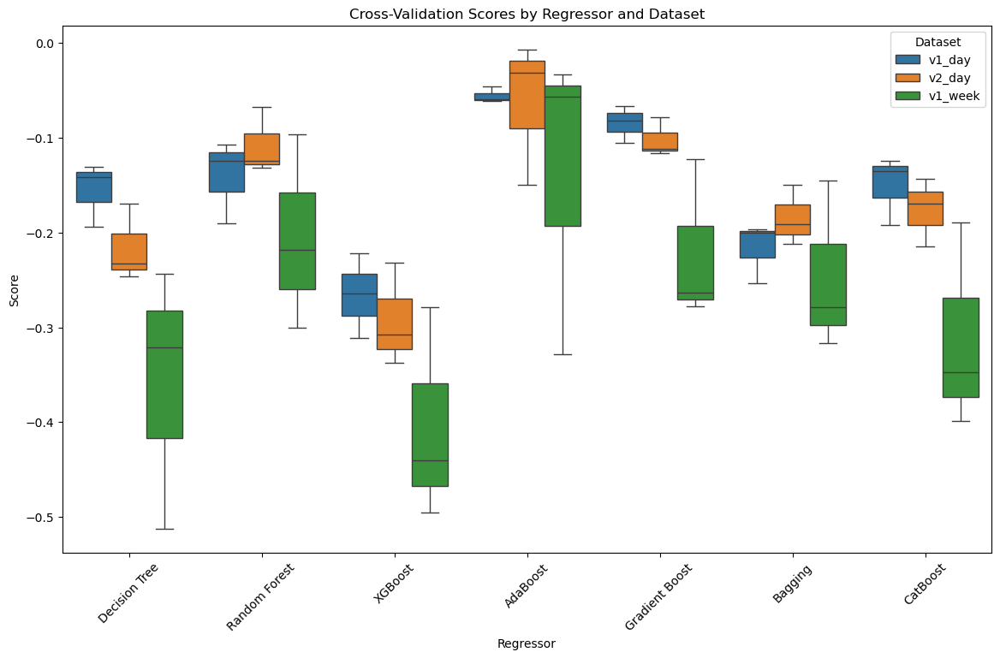

In [4]:
from sklearn.model_selection import GroupKFold, cross_val_score
id_columns.append('idx')
results = {}
for name in df_names:
    results[name] = {}
    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_train.csv'))
    X_test = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_test.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_train.csv'))
    y_test= pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_test.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=3)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    # Evaluate each classifier using cross-validation
    for reg_name, reg in regs_someNA:
        cv_scores = cross_val_score(reg, X_train_cleaned, y_train_cleaned, groups=groups, cv=gkf, scoring='r2')
        results[name][reg_name] = cv_scores


# Extract data to flattened df for plotting
flat_results = []

for dataset_name, reg_results in results.items():
    for reg_name, scores in reg_results.items():
        for score in scores:
            flat_results.append({
                'Dataset': dataset_name,
                'Regressor': reg_name,
                'Score': score
            })


results_df = pd.DataFrame(flat_results)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=results_df)
plt.xticks(rotation=45)
plt.title('Cross-Validation Scores by Regressor and Dataset')
plt.show()


In [ ]:
## Catboost RandomSearch
#results = {}
#for name in df_names:
print(f"--- Dataset: {name} ---")
X_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
y_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
# test
X_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
y_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))

X_train = X_train_unclean.drop(columns=[col for col in X_train_unclean.columns if col in id_columns or 'Unnamed' in col])
y_train = y_train_unclean.drop(columns=[col for col in y_train_unclean.columns if 'Unnamed' in col]).squeeze()
X_test = X_test_unclean.drop(columns=[col for col in X_test_unclean.columns if col in id_columns or 'Unnamed' in col])
y_test = y_test_unclean.drop(columns=[col for col in y_test_unclean.columns if 'Unnamed' in col]).squeeze()

# Define parameter grid based on dataset
if name == "v1_day":
    param_grid = {
            'n_estimators': [i for i in range(50, 200)],
            'learning_rate': [round(x, 2) for x in np.arange(0.05, 1.05, 100)],
            'subsample': [i for i in np.linspace(0.01, 0.99, 100)],
        }
elif name == "v2_day":
    param_grid = {
            'n_estimators': [i for i in range(50, 200)],
            'learning_rate': [round(x, 2) for x in np.arange(0.05, 1.05, 100)],
            'subsample': [i for i in np.linspace(0.01, 0.99, 100)],
        }

# Initialize the CatBoostClassifier
model = GradientBoostingClassifier(random_state=42, verbose=0)

# Perform grid search
grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=100,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42,
    error_score='raise'
)

# Log best results
grid.fit(X_train, y_train)

best_params = grid.best_params_

final_model = GradientBoostingClassifier(**best_params, random_state=42)

final_model.fit(X_train, y_train)
score = final_model.score(X_test, y_test)

results[name] = {
    "best_params": best_params,
    "best_score": score
    }

print(results[name])

The best parameters for each model are saved into {name}_catboost_gridsearch_results.json. From this we've gotten the 'best parameters' found, as well as an accuracy score. We can use these accuracy scores to compare to the increases in accuracy from optimizing hyperparameters.

## more specified hyperparameter optimization
From those parameter dicts we can make the parameter space smaller and more specifically find the optimal parameters for each aspect of the model. We'll use a random search still to decrease the compute time, but increase the iterations and decrease the ranges for each parameter.

We can then use the optimized hyperparameters and evaluate the accuracy score of the final model.

We'll use RMSE because we're interested in generally predicting the area of the depression score each subject is in.

In [ ]:
optimized_results = {}
for name in df_names:
    print(f"--- Dataset: {name} ---")
    X_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
    y_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
    # test
    X_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
    y_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))

    X_train = X_train_unclean.drop(columns=[col for col in X_train_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_train = y_train_unclean.drop(columns=[col for col in y_train_unclean.columns if 'Unnamed' in col]).squeeze()
    X_test = X_test_unclean.drop(columns=[col for col in X_test_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_test = y_test_unclean.drop(columns=[col for col in y_test_unclean.columns if 'Unnamed' in col]).squeeze()

    # Define parameter grid based on dataset
    if name == "v1_day":
        param_grid = {
            'n_estimators': [i for i in range(120, 150)],
            'max_depth': [i for i in range(8, 20)],
            'min_samples_split': [i for i in range(50, 100)],
            'min_samples_leaf': [i for i in range(xx)],
            'max_features': [i for i in range(4, 12)],
            }
    elif name == "v2_day":
        param_grid = {
            'n_estimators': [i for i in range(50, 200)],
            'max_depth': [i for i in range(2, 15)],
            'min_samples_split': [i for i in range(50, 500)],
            'min_samples_leaf': [i for i in range(50, 500)],
            'max_features': [i for i in range(4, 12)],
        }
    elif name == "v1_week":
        param_grid = {
            'n_estimators': [i for i in range(120, 150)],
            'max_depth': [i for i in range(8, 20)],
            'min_samples_split': [i for i in range(50, 100)],
            'min_samples_leaf': [i for i in range(xx)],
            'max_features': [i for i in range(4, 12)],
        }
    
    # Initialize the CatBoostClassifier
    model = GradientBoostingClassifier(random_state=42, verbose=0)

    # Perform grid search
    grid = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=500,
        scoring='accuracy',
        n_jobs=-1,
        random_state=42
    )

    # Log best results
    grid.fit(X_train, y_train)

    best_params = grid.best_params_
    optimized_results[name] = {"best_params": best_params}

    final_model = GradientBoostingClassifier(**best_params, random_state=42)

    final_model.fit(X_train, y_train)
    score = final_model.score(X_test, y_test)

    optimized_results[name] = {
        "best_params": best_params,
        "best_score": score
        }

    print(optimized_results[name])



--- Dataset: v1_day ---
{'best_params': {'subsample': 0.651503006012024, 'n_estimators': 52, 'learning_rate': 0.0001}, 'best_score': 0.673939393939394}
--- Dataset: v2_day ---
{'best_params': {'subsample': 0.999, 'n_estimators': 152, 'learning_rate': 0.0001}, 'best_score': 0.522673031026253}
--- Dataset: v1_week ---
{'best_params': {'subsample': 0.676753507014028, 'n_estimators': 52, 'learning_rate': 0.0001}, 'best_score': 0.24285714285714285}


#### Increased random search results
Now we can see the best parameters for each dataset, as well as the accuracy over all crossfolds. 

v1_day_predictions.json:
{
    "accuracy": 0.674
}  

v2_day_predictions.json:
{
    "accuracy": 0.523
}  

v1_week_predictions.json:
{
    "accuracy": 0.243
}


### Evaluating results
We can now see the accuracy of each loosely-optimized hyperparameter model and increased-optimized hyperparameter model. We compare the accuracies in this below chart: 

In [106]:
results_df = pd.DataFrame(results).reset_index()
results_df['loose_model'] = 'loose_model'
opt_results_df = pd.DataFrame(optimized_results).reset_index()
opt_results_df['optimized_model'] = 'optimized_model'
total = pd.concat([results_df, opt_results_df], axis=0)
total = total[total['index']=='best_score']
total['model'] = total['loose_model'].astype(str).replace('nan','') + total['optimized_model'].astype(str).replace('nan','')
total = total.drop(columns=['optimized_model','loose_model'])
df_melted = total.melt( # Melt the DataFrame
    id_vars=['model'],
    value_vars=['v1_day', 'v2_day', 'v1_week'],
    var_name='variable',
    value_name='score'
)
fig = px.bar(
    df_melted,
    x='variable',    # x-axis: v1_day, v2_day, v1_week
    y='score',       # y-axis: score value
    color='model',   # bar color: loose_model vs optimized_model
    barmode='group', # grouped bars next to each other
    text='score',    # show value labels
    title='Model Comparison Across v1_day, v2_day, and v1_week',
    labels={'variable': 'Dataset', 'score': 'Accuracy Score'}
)

fig.show()


Tuning the hyperparameters further gave us an increase in accuracy for v1_week by about 5%. For v1_day it didn't change and for v1_week it deceased around 3%.

### Bayesian Hyperparameter Optimization
This took over 9 hours and still didn't converge, so let's try another method. 

First we'll try to optimize hyperparameters for KNN.

In [30]:
from sklearn.metrics import accuracy_score
name = 'v1_day'
X_train_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
X_train_cleaned = X_train_df.drop(columns=[col for col in X_train_df.columns if col in id_columns or 'Unnamed' in col])
y_train_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
y_train_cleaned = y_train_df.drop(columns=[col for col in y_train_df.columns if 'Unnamed' in col]).squeeze()

X_test_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
X_test_cleaned = X_test_df.drop(columns=[col for col in X_test_df.columns if col in id_columns or 'Unnamed' in col])
y_test_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))
y_test_cleaned = y_test_df.drop(columns=[col for col in y_test_df.columns if 'Unnamed' in col]).squeeze()

X_df = pd.concat([X_train_cleaned, X_test_cleaned], axis=0)
y_df = pd.concat([y_train_cleaned, y_test_cleaned], axis=0)

X = X_df.to_numpy()
y = y_df.to_numpy()
X_train = X_train_cleaned.to_numpy()
y_train = y_train_cleaned.to_numpy()
X_test = X_test_cleaned.to_numpy()
y_test = y_test_cleaned.to_numpy()


def hyperopt_train_test(params):
    clf = KNeighborsClassifier(**params)
    return cross_val_score(clf, X, y).mean()

space4knn = {
    'n_neighbors': hp.choice('n_neighbors', range(1, 31)),  # 30 values
    'weights': hp.choice('weights', ['uniform', 'distance']),
    'algorithm': hp.choice('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute']),
    'leaf_size': hp.quniform('leaf_size', 10, 50, 1)
}

def f(params):
    clf = KNeighborsClassifier(
        n_neighbors=params['n_neighbors'],
        weights=params['weights'],
        algorithm=params['algorithm'],
        leaf_size=int(params['leaf_size'])
    )
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    acc = accuracy_score(y_test, preds)
    return {'loss': -acc, 'status': STATUS_OK}
    # acc = cross_val_score(clf, X_train, y_train, cv=5).mean()  # Use cross-validation    return {'loss': -acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=100, trials=trials)
print(f'best: {best}')


  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

job exception: ('switch argument was', 1)



  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]


TypeError: ('switch argument was', 1)

In [ ]:
f, ax = plt.subplots(1)#, figsize=(10,10))
xs = [t['misc']['vals']['n'] for t in trials.trials]
ys = [-t['result']['loss'] for t in trials.trials]
ax.scatter(xs, ys, s=20, linewidth=0.01, alpha=0.5)
ax.set_title('Iris Dataset - KNN', fontsize=18)
ax.set_xlabel('n_neighbors', fontsize=12)
ax.set_ylabel('cross validation accuracy', fontsize=12)

In [27]:
from sklearn import datasets
iris = datasets.load_iris()
X = iris.data
print(type(X))
y = iris.target
print(type(y))


<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
